# Мартьянова Александра Евгеньевна, курс «Data Science», ВКР

# Часть 1. Статистические модели

### Загрузка библиотек

In [2]:
# Загрузка разных библиотек
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statistics
from scipy.stats import f_oneway

### 1. Подготовка и предобработка данных

Исходный датасет по композитам

###### Датасет со свойствами композитов. Объединение по индексу, тип объединения INNER

In [3]:
# Загрузка в объект DataFrame файла X_bp.xlsx, метод read_excel
x_bp = pd.read_excel('X_bp.xlsx', index_col = 0)
x_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [4]:
# Определение количества строк и столбцов объекта, метод shape
x_bp.shape

(1023, 10)

In [5]:
# Вывод сведений об объекте DataFrame, метод info()
x_bp.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1023 entries, 0.0 to 1022.0
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(10)
memory usage: 87.9 KB


In [6]:
# Загрузка в объект DataFrame файла X_nup.xlsx, метод read_excel
x_nup = pd.read_excel('X_nup.xlsx', index_col = 0)
x_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.0,4.0,57.0
1.0,0.0,4.0,60.0
2.0,0.0,4.0,70.0
3.0,0.0,5.0,47.0
4.0,0.0,5.0,57.0


In [7]:
# Определение количества строк и столбцов объекта, метод shape
x_nup.shape

(1040, 3)

In [8]:
# Вывод сведений об объекте DataFrame, метод info()
x_nup.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1040 entries, 0.0 to 1039.0
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Угол нашивки, град  1040 non-null   float64
 1   Шаг нашивки         1040 non-null   float64
 2   Плотность нашивки   1040 non-null   float64
dtypes: float64(3)
memory usage: 32.5 KB


In [9]:
# соединение объектов DataFrame, метод merge, объединение по индексу, тип объединения INNER
df_s = x_bp.merge(x_nup, how = 'inner', left_index = True, right_index = True)
df_s.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


In [10]:
# Вывод сведений о новом объекте DataFrame df_s, метод info()
df_s.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1023 entries, 0.0 to 1022.0
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   float64
 11  Шаг нашивки

Вывод: соединение произведено по индексам, и часть данных была отброшена при соединении датасетов в общий новый датасет. Тип данных во всех колонках - float64.

In [11]:
# Изменение типа данных индекса, метод astype('int')
df_s.index = df_s.index.astype('int')
df_s

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


Вывод: индексы - целые числа

In [12]:
# Проверка наличия пропусков типа NULL и NaN в объекте DataFrame, методы isnull(), isna() и sum()
print(df_s.isnull().sum())
print()
print(df_s.isna().sum())

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град  

Вывод: пропуски в датасете отсутствуют

In [13]:
# Проверка наличия дубликатов в объекте DataFrame, методы duplicated() и sum()
df_s.duplicated().sum()

0

Выводы: дубликаты в датасете отсутствуют

ПРЕДВАРИТЕЛЬНОЕ ЗАКЛЮЧЕНИЕ ПО ДАТАСЕТУ: датасет качественный: пропуски и дубликаты в датасете отсутствуют, вероятно он подвергался какой-то обработке заранее. 


Датасет представляет собой результаты испытаний на растяжение композитных материалов, тем не менее, данные, которые относятся к результатам замера геометрических параметров образцов, в нем отсутствуют. Восполним этот пробел и создадим соответствующие столбцы:

In [14]:
# Относительное удлинение при растяжении без нормирования 
df_s['Относительное удлинение при растяжении'] = df_s['Прочность при растяжении, МПа'] / df_s['Модуль упругости при растяжении, ГПа']

In [15]:
# относительное удлиненее без нормирования
df_s['Относительное удлинение'] = df_s['Прочность при растяжении, МПа'] / df_s['модуль упругости, ГПа']

In [16]:
df_s

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000,42.857143,4.060986
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000,42.857143,4.060986
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,70.000000,42.857143,4.060986
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000,42.857143,4.060986
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000,42.857143,3.984064
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770,32.661939,2.615192
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790,32.369254,5.307442
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684,35.631624,6.388370
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074,27.980012,2.794045


In [17]:
# Определение количества строк и столбцов датасета df_s, метод shape
df_s.shape

(1023, 15)

In [18]:
# Проверка количества уникальных значений в каждом столбце датасета df_s, метод nunique()
df_s.nunique()

Соотношение матрица-наполнитель           1014
Плотность, кг/м3                          1013
модуль упругости, ГПа                     1020
Количество отвердителя, м.%               1005
Содержание эпоксидных групп,%_2           1004
Температура вспышки, С_2                  1003
Поверхностная плотность, г/м2             1004
Модуль упругости при растяжении, ГПа      1004
Прочность при растяжении, МПа             1004
Потребление смолы, г/м2                   1003
Угол нашивки, град                           2
Шаг нашивки                                989
Плотность нашивки                          988
Относительное удлинение при растяжении    1004
Относительное удлинение                   1020
dtype: int64

Вывод: в колонке 'Угол нашивки, град' всего два значения, в остальных столбцах гораздо больше, например в столбце 'модуль упругости, ГПа' таковых 1020 из 1023

In [19]:
# Определение уникальных значений в столбце 'Угол нашивки, град', метод unique()
df_s['Угол нашивки, град'].unique()

array([ 0., 90.])

Вывод: категориальный параметр 'Угол нашивки, град' имеет всего два уровня, может рассматриваться как порядковый и для дальнейшей обработки подвергается ранжировке

In [20]:
# Подсчет количества строк по уникальным значениям столбца 'Угол нашивки, град', метод count()
df_s['Угол нашивки, град'][df_s['Угол нашивки, град'] == 0.0].count()

520

In [21]:
print('count, 0 degeree: ', df_s['Угол нашивки, град'][df_s['Угол нашивки, град'] == 0.0].count())
print('count, 90 degeree: ', df_s['Угол нашивки, град'][df_s['Угол нашивки, град'] == 90.0].count())
print('count, 90 degeree, проверка: ', df_s.shape[0] - df_s['Угол нашивки, град'][df_s['Угол нашивки, град'] == 0.0].count())

count, 0 degeree:  520
count, 90 degeree:  503
count, 90 degeree, проверка:  503


In [22]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df_s.dtypes['Угол нашивки, град']

dtype('float64')

In [23]:
# Изменение типа данных и ранжировка переменной 'Угол нашивки, град', метод astype('int')
df_s = df_s.replace({'Угол нашивки, град': {0.0 : 0, 90.0 : 1}})
df_s['Угол нашивки, град'] = df_s['Угол нашивки, град'].astype(int)

In [24]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df_s.dtypes['Угол нашивки, град']

dtype('int32')

In [25]:
# Описательная статистика датасета df_s, метод describe()
df_s.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.491691,6.899222,57.153929,33.704329,7.427613
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,0.500175,2.563467,12.350969,6.793861,41.155005
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000,13.098005,0.881994
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212,29.076471,2.485563
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920,33.602706,3.418615
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,1.000000,8.586293,64.944961,37.990668,4.876902
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,1.000000,14.440522,103.988901,55.351970,1090.580554


###### Построение графиков рассеяния и распределения переменных, а также графиков "ящики с усами"

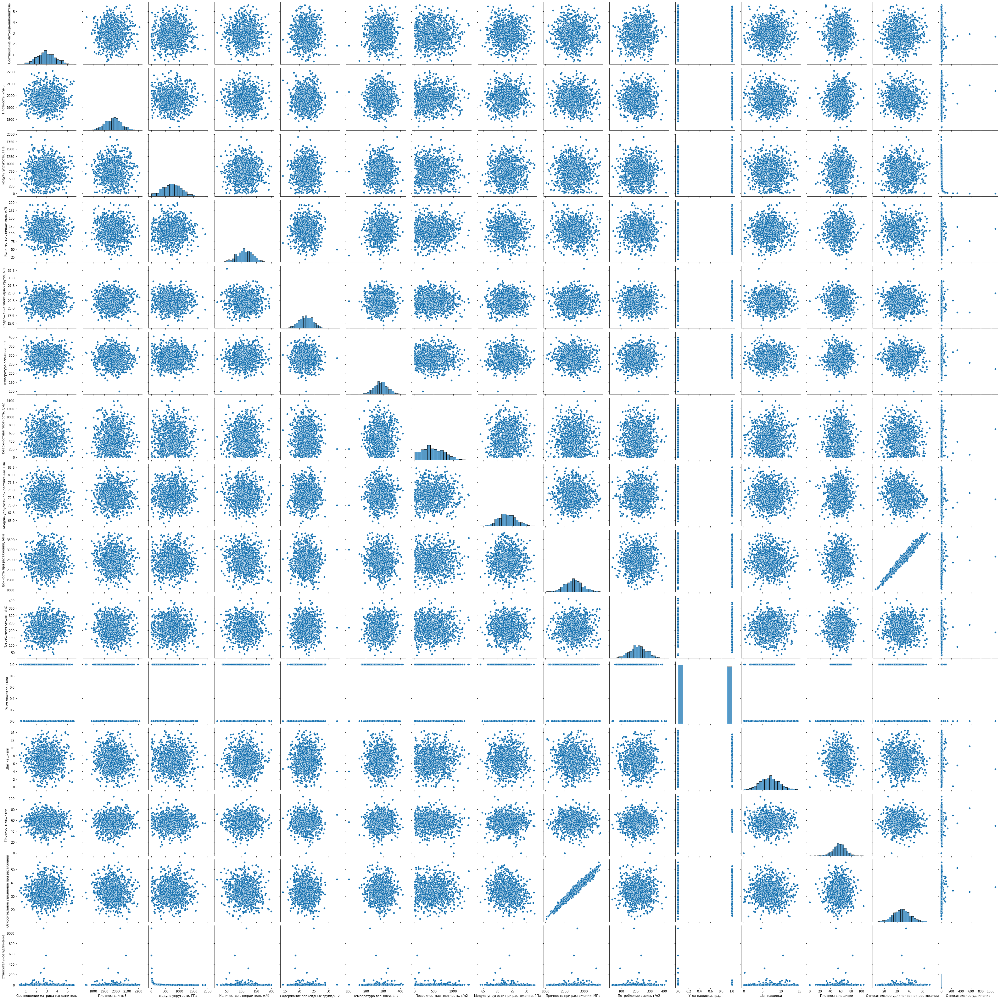

In [26]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(df_s, height=3)

Вывод: попарные графики рассеяния не показывают какой-либо зависимости между параметрами, впечатление кучности, вид случайных данных с нормальным распределением, кроме данных столбца 'Угол нашивки', которые являются категориальной переменной и имеют два ранжированных уровня: 0 и 1, а также столбцов 'Относительное удлинение при растяжении' и 'Относительное удлинение'. Столбец 'Относительное удлинение при растяжении' показывает связь со столбцом 'Прочность при растяжении, МПа'

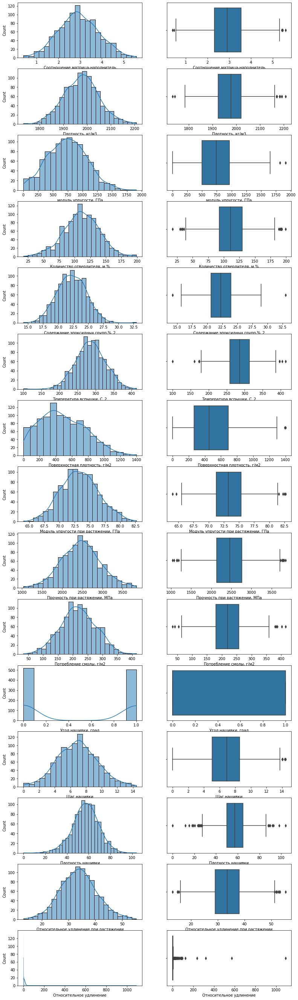

In [27]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(15, 2, figsize=(13, 48))
for k, column in enumerate(df_s.columns):    
    sns.histplot(data=df_s, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=df_s, x=column, ax=axes[k, 1])
plt.show()

Вывод: на первый взгляд, судя по графикам распределения переменных параметров близки к нормальным, кроме 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2', 'Угол нашивки' и 'Относительное удлинение'. Судя по графикам рассеяния и графикам "ящики с усами", имеются выбросы.

Требуется дополнительно оценить нормальность распределения параметров по статистическому критерию.

Требуется оценить также корреляцию параметров между собой, а для параметров, имеющих статистически значимую корреляцию, выполнить построение модели статистической регрессии и оценить ее статистическую адекватность.

Требуется произвести сравнение двух групп данных по столбцу 'Угол нашивки' для оценки влияния этого категориального параметра на  количественные параметры датасета.

Требуется очистить данные от выбросов.

###### Создание датасета с исключенным категориальным параметром

In [28]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

Параметр 'Угол нашивки' - категориальный, поэтому требуется его исключение при оценке нормальности распределения и для построения матрицы корреляции по критерию Пирсона

In [29]:
# Создание нового датасета df_d без столбца 'Угол нашивки'
df_d=df_s[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки', 'Относительное удлинение при растяжении', 'Относительное удлинение']]
df_d.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,4.0,57.0,42.857143,4.060986
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,4.0,60.0,42.857143,4.060986
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,4.0,70.0,42.857143,4.060986
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,5.0,47.0,42.857143,4.060986
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,5.0,57.0,42.857143,3.984064


In [30]:
# Вывод сведений о названиях столбцов датасета df_d, метод columns
df_d.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

Вывод: столбец 'Угол нашивки, град' в датасете df_d отсутствует

### 2. Оценка нормальности распределения параметров

In [31]:
# Описательная статистика датасета df_d, метод describe()
df_d.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,6.899222,57.153929,33.704329,7.427613
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,2.563467,12.350969,6.793861,41.155005
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,13.098005,0.881994
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,5.080033,49.799212,29.076471,2.485563
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,6.916144,57.341920,33.602706,3.418615
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,8.586293,64.944961,37.990668,4.876902
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,14.440522,103.988901,55.351970,1090.580554


In [32]:
# Описательная статистика датасета df_d, метод describe() библиотеки scipy.stats
stats.describe(df_d)

DescribeResult(nobs=1023, minmax=(array([3.89402605e-01, 1.73176464e+03, 2.43690875e+00, 1.77402746e+01,
       1.42549855e+01, 1.00000000e+02, 6.03739925e-01, 6.40540606e+01,
       1.03685661e+03, 3.38030255e+01, 0.00000000e+00, 0.00000000e+00,
       1.30980051e+01, 8.81993807e-01]), array([   5.5917416 , 2207.77348061, 1911.536477  ,  198.95320719,
         33.        ,  413.27341824, 1399.54236234,   82.68205104,
       3848.43673188,  414.59062836,   14.44052188,  103.9889013 ,
         55.35197013, 1090.58055367])), mean=array([   2.93036577, 1975.73488811,  739.92323276,  110.57076865,
         22.24438955,  285.88215135,  482.73183304,   73.32857125,
       2466.9228427 ,  218.42314368,    6.89922208,   57.15392943,
         33.70432942,    7.42761261]), variance=array([8.33974853e-01, 5.43599944e+03, 1.09052897e+05, 8.00658596e+02,
       5.79028591e+00, 1.67635054e+03, 7.91379549e+04, 9.72805426e+00,
       2.35834560e+05, 3.56838144e+03, 6.57136343e+00, 1.52546430e+02,
    

In [33]:
# Описательная статистика в упорядоченном виде по столбцам датасета df_d
for col in df_d.columns:
    med = statistics.median(df_d[col])
    mean = statistics.mean(df_d[col])
    mod = statistics.mode(df_d[col])
    std = statistics.stdev(df_d[col])
    var = statistics.variance(df_d[col])
    skew = stats.skew(df_d[col])
    kurt = stats.kurtosis(df_d[col])
    max_ = (df_d[col]).max()
    min_ = (df_d[col]).min()
    scope = (df_d[col]).max() - (df_d[col]).min()
    confidence = stats.norm.interval(alpha=0.95, loc=np.mean(df_d[col]), scale=stats.sem(df_d[col]))
    print('\n \t', col, ': \t \n'   'Среднее: ', mean, '\t' 'Медиана: ', med, '\t' 'Мода : ', mod, 
          '\n' 'Стандарт : ', std, '\t' 'Дисперсия: ', var, 
          '\n' 'Асимметрия: ', skew, '\t' 'Эксцесс: ', kurt, 
          '\n' 'Минимум: ', min_, '\t' 'Максимум: ', max_, '\t' 'Размах: ', scope, 
          '\n' 'ДоверитИнтервалСредн: ', confidence) 



 	 Соотношение матрица-наполнитель : 	 
Среднее:  2.9303657734325483 	Медиана:  2.90687765033521 	Мода :  1.85714285714285 
Стандарт :  0.9132222362148388 	Дисперсия:  0.8339748527172307 
Асимметрия:  0.08215047390733503 	Эксцесс:  -0.20422037310846086 
Минимум:  0.389402605178414 	Максимум:  5.59174159869754 	Размах:  5.202338993519127 
ДоверитИнтервалСредн:  (2.8744046078183585, 2.9863269390467426)

 	 Плотность, кг/м3 : 	 
Среднее:  1975.7348881101545 	Медиана:  1977.62165679058 	Мода :  2030.0 
Стандарт :  73.72923055065388 	Дисперсия:  5435.999437591473 
Асимметрия:  0.05854323312878896 	Эксцесс:  0.05745882123102097 
Минимум:  1731.764635096 	Максимум:  2207.77348061119 	Размах:  476.00884551518993 
ДоверитИнтервалСредн:  (1971.2168491073446, 1980.252927112965)

 	 модуль упругости, ГПа : 	 
Среднее:  739.9232327560723 	Медиана:  739.664327697792 	Мода :  738.736842105263 
Стандарт :  330.23158056102693 	Дисперсия:  109052.89679983404 
Асимметрия:  0.11999727729086174 	Эксцесс: 

Вывод: по всем столбцам, кроме 'Относительное удлинение', средние значения укладываются в доверительные интервалы для средних, мода смещена для некоторых параметров, стандартное отклонение имеет порядок ниже размаха, асимметрия и эксцесс близки к нормальным (близки к 0). Создается впечатление в целом нормального распределения всех параметров.

Примечание: оценка эксцесса рассчитывается по формуле, из которой вычитается 3, чтобы упростить сравнение с нормальным распределением

Тест д'Агостино (по имени Ralph D’Agostino) вычисляет итоговую статистику на основе распределения( эксцесс и асимметрия), чтобы определить, отклоняется ли рассматриваемое распределение данных от нормального, задан уровень значимости 0,05.

Параметр 'Угол нашивки, град' изначально не имеет нормального распределения, поэтому по нему не рассчитывается тест д'Агостино.

Оценка нормальности распределения параметров по статистическому критерию д'Агостино:

In [34]:
# Проверка по критерию д'Агостино
accepted_list = []
rejected_list = []

for col in df_d.columns:
    alpha = 0.05
    stat, p = stats.normaltest(df_d[col]) # Критерий согласия д'Агостино
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=3.084, p-value=0.214
Плотность, кг/м3 : 	 	 	Statistics=0.824, p-value=0.662
модуль упругости, ГПа : 	 	 	Statistics=4.556, p-value=0.103
Количество отвердителя, м.% : 	 	 	Statistics=2.223, p-value=0.329
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.629, p-value=0.730
Температура вспышки, С_2 : 	 	 	Statistics=2.018, p-value=0.365
Поверхностная плотность, г/м2 : 	 	 	Statistics=38.511, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=3.946, p-value=0.139
Прочность при растяжении, МПа : 	 	 	Statistics=1.109, p-value=0.574
Потребление смолы, г/м2 : 	 	 	Statistics=0.645, p-value=0.724
Шаг нашивки : 	 	 	Statistics=1.785, p-value=0.410
Плотность нашивки : 	 	 	Statistics=25.992, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=2.450, p-value=0.294
Относительное удлинение : 	 	 	Statistics=2367.429, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матр

Вывод: по тесту по д'Агостино параметры 'Поверхностная плотность, г/м2', 'Плотность нашивки' и 'Относительное удлинение' имеют вид распределения статистически отличный от нормального, распределения всех остальных параметров статистически не отличаются от нормального (уровень значимости 0,05)

Критерий Шапиро-Уилка применяется для выборок до 5000 наблюдений, поэтому может быть применен и здесь

In [35]:
# Количество наблюдений, метод shape
df_d.shape[0]

1023

Оценка нормальности распределения параметров по статистическому критерию Шапиро-Уилка:

In [36]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_d.columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_d[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.998, p-value=0.277
Плотность, кг/м3 : 	 	 	Statistics=0.999, p-value=0.549
модуль упругости, ГПа : 	 	 	Statistics=0.996, p-value=0.007
Количество отвердителя, м.% : 	 	 	Statistics=0.998, p-value=0.209
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.998, p-value=0.265
Температура вспышки, С_2 : 	 	 	Statistics=0.998, p-value=0.283
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.978, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.998, p-value=0.174
Прочность при растяжении, МПа : 	 	 	Statistics=0.998, p-value=0.221
Потребление смолы, г/м2 : 	 	 	Statistics=0.999, p-value=0.709
Шаг нашивки : 	 	 	Statistics=0.998, p-value=0.176
Плотность нашивки : 	 	 	Statistics=0.993, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=0.998, p-value=0.373
Относительное удлинение : 	 	 	Statistics=0.078, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

Вывод: по тесту Шапиро-Уилка параметры 'модуль упругости, ГПа', 'Поверхностная плотность', 'Плотность нашивки' и 'Относительное удлинение' имеют вид распределения статистически отличный от нормального, распределения всех остальных параметров статистически не отличаются от нормального (уровень значимости 0,05).

Критерий  Шапиро-Уилка оказался чувствительнее, параметр 'модуль упругости, ГПа' не подчиняется нормальному распределению, так же, как и параметры 'Поверхностная плотность' и 'Плотность нашивки'

### 3. Оценка корреляции параметров

Корреляция для количественных параметров и количественно-категориальных оценивается по критериям Пирсона и Спирмена соответственно

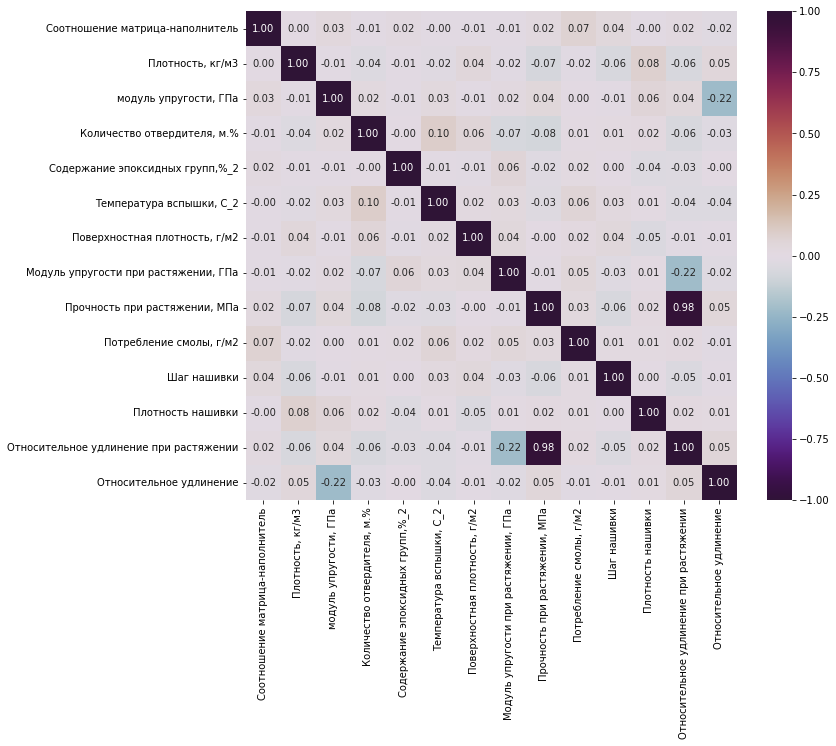

In [37]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

Вывод: судя по матрице корреляции, построенной на основании корреляции по Пирсону для количественных данных, коэффициенты корреляции малы, кроме параметров 'Относительное удлинение при растяжении', 'Относительное удлинение', 'модуль упругости, ГПа' и 'Модуль упругости при растяжении, ГПа'  (они связаны детерминистически), поэтому следует сформулировать и проверить статистическую гипотезу для проверки значимости попарной связи между всеми количественными параметрами.

In [38]:
# Вывод сведений о названиях столбцов датасета df_d, метод columns
df_d.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

Проверка корреляции по критерию Пирсона:

формулировка гипотезы:

H0: R = 0,

H1: R не равен 0 с заданным уровнем значимости равным 0,05

In [39]:
# Проверка по критерию Пирсона
count = 0 
for col in df_d.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_d.columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_d[col], df_d[col1]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель









Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 		 
Statistics=0.073, p-value=0.020





2
Плотность, кг/м3







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.070, p-value=0.025



Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.080, p-value=0.010

Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 
Statistics=-0.062, p-value=0.046


3
модуль упругости, ГПа











Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.223, p-value=0.000

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.095, p-value=0.002


Наименование колонок и строк С 

Вывод: статистически значимыми по критерию Пирсона оказываются следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 Statistics=-0.062, p-value=0.046
    модуль упругости, ГПа  &  Относительное удлинение : 		 Statistics=-0.223, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении :  Statistics=-0.216, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении :  Statistics=0.977, p-value=0.000             

Учитывая, что изначально присутствует категориальный параметр 'Угол нашивки', следует проверить статистическую значимость попарных корреляций этого параметра с остальными параметрами по критерию Спирмена:

In [40]:
# ранговая корреляция Спирмена с учетом того, что присутствует категориальный параметр 'Угол нашивки'
df_s.corr(method='spearman')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
Соотношение матрица-наполнитель,1.000000,-0.005542,0.031823,0.002496,0.016358,-0.013635,-0.003896,-0.006459,0.017554,0.054084,-0.026190,0.032510,0.004570,0.015541,-0.016903
"Плотность, кг/м3",-0.005542,1.000000,-0.010097,-0.032907,-0.012287,-0.030447,0.055071,-0.032446,-0.069816,-0.025729,-0.063073,-0.045941,0.080001,-0.060979,-0.005448
"модуль упругости, ГПа",0.031823,-0.010097,1.000000,0.033397,0.002016,0.031247,-0.001318,0.007705,0.033750,0.008010,-0.038800,-0.011851,0.072628,0.030159,-0.911262
"Количество отвердителя, м.%",0.002496,-0.032907,0.033397,1.000000,-0.001652,0.086970,0.050751,-0.064127,-0.067707,-0.006371,0.030222,0.008440,0.025265,-0.057493,-0.056531
"Содержание эпоксидных групп,%_2",0.016358,-0.012287,0.002016,-0.001652,1.000000,-0.003641,-0.011232,0.061930,-0.019193,0.014230,0.005714,-0.007421,-0.032182,-0.033359,-0.013232
"Температура вспышки, С_2",-0.013635,-0.030447,0.031247,0.086970,-0.003641,1.000000,0.025441,0.024625,-0.028283,0.051763,0.021886,0.043075,0.008160,-0.034829,-0.030066
"Поверхностная плотность, г/м2",-0.003896,0.055071,-0.001318,0.050751,-0.011232,0.025441,1.000000,0.035319,-0.008221,-0.005344,0.055637,0.037675,-0.032404,-0.016527,-0.002281
"Модуль упругости при растяжении, ГПа",-0.006459,-0.032446,0.007705,-0.064127,0.061930,0.024625,0.035319,1.000000,-0.009970,0.052450,0.027458,-0.014210,-0.003225,-0.215380,-0.018945
"Прочность при растяжении, МПа",0.017554,-0.069816,0.033750,-0.067707,-0.019193,-0.028283,-0.008221,-0.009970,1.000000,0.020831,0.025226,-0.071915,0.014950,0.973655,0.331721
"Потребление смолы, г/м2",0.054084,-0.025729,0.008010,-0.006371,0.014230,0.051763,-0.005344,0.052450,0.020831,1.000000,-0.002940,0.009288,0.016236,0.006211,0.006243


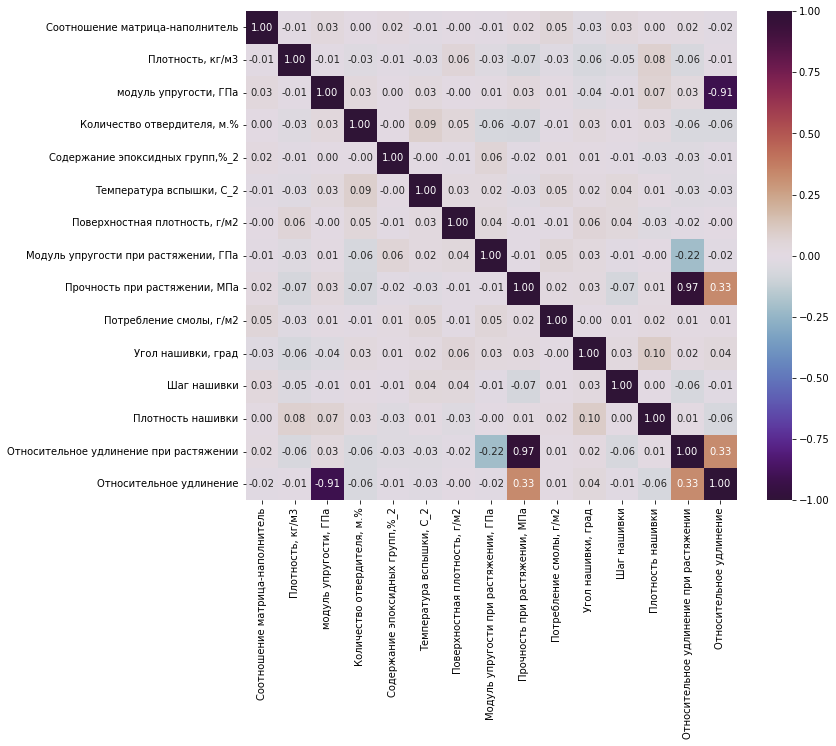

In [41]:
# Мартица корреляции по ранговому критерию корреляции Спирмена для категориальных и количественно-категориальных параметров
fig, ax = plt.subplots(figsize=(11, 9)) # аргумент 'spearman' указывает на критерий Спирмена
hm = sns.heatmap(df_s.corr(method = 'spearman'),  vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)

Вывод: судя по матрице корреляции, построенной на основании корреляции по Спирмену для количественных и качественных данных, коэффициенты корреляцим малы, кроме параметров 'Относительное удлинение при растяжении', 'Относительное удлинение', 'модуль упругости, ГПа' и 'Модуль упругости при растяжении, ГПа'  (они связаны детерминистически), поэтому следует сформулировать и проверить статистическую гипотезу для проверки значимости попарной связи между категориальным параметром 'Угол нашивки, град' и остальными параметрами.

In [42]:
# Вывод сведений о названиях столбцов датасета df_s, метод columns
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

Проверка корреляции по критерию Спирмена:

формулировка гипотезы: 

H0: R = 0, 

H1: R не равен 0 с заданным уровнем значимости равным 0,05

In [43]:
# Проверка по критерию Спирмена
accepted_list = []
rejected_list = []

for col in df_s.columns:
    alpha = 0.05
    stat, p = stats.spearmanr(df_s['Угол нашивки, град'] , df_s[col]) # ранговая корреляция Спирмена
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=-0.026, p-value=0.403
Плотность, кг/м3 : 	 	 	Statistics=-0.063, p-value=0.044
модуль упругости, ГПа : 	 	 	Statistics=-0.039, p-value=0.215
Количество отвердителя, м.% : 	 	 	Statistics=0.030, p-value=0.334
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.006, p-value=0.855
Температура вспышки, С_2 : 	 	 	Statistics=0.022, p-value=0.484
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.056, p-value=0.075
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.027, p-value=0.380
Прочность при растяжении, МПа : 	 	 	Statistics=0.025, p-value=0.420
Потребление смолы, г/м2 : 	 	 	Statistics=-0.003, p-value=0.925
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.026, p-value=0.408
Плотность нашивки : 	 	 	Statistics=0.101, p-value=0.001
Относительное удлинение при растяжении : 	 	 	Statistics=0.019, p-value=0.553
Относительное удлинение : 	 	 	Statistics=0.037, p-value=0.243

Наименование колонок,

Вывод: существует статистически значимая попарная корреляционная связь по критерию Спирмена между параметрами: 'Угол нашивки, град' и 'Плотность, кг/м3', а также 'Угол нашивки, град' и 'Плотность нашивки'.

Ранее было показано, что по тесту Шапиро-Уилка параметры 'модуль упругости, ГПа', 'Поверхностная плотность', 'Плотность нашивки' и 'Относительное удлинение' имеют вид распределения статистически отличный от нормального, поэтому корреляцию этих параметров между собой и с остальными параметрами следует проверять по критерию Спирмена

In [44]:
# Проверка по критерию Спирмена
count = 0 
for col in df_s.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_s.columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_s[col], df_s[col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель















2
Плотность, кг/м3







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.070, p-value=0.026


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=-0.063, p-value=0.044


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.080, p-value=0.010



3
модуль упругости, ГПа










Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.073, p-value=0.020


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.911, p-value=0.000

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.087, p-value=0.005


Наименование колонок и строк С корреляцией: 
Количество отвердит

Вывод: кроме того для параметров 'модуль упругости, ГПа', 'Поверхностная плотность', 'Плотность нашивки' и 'Относительное удлинение' проверка по критерию Спирмена показала, что значимы следующие корреляции:

    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.073, p-value=0.020
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.911, p-value=0.000
    Угол нашивки, град  &  Плотность нашивки : Statistics=0.101, p-value=0.001
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.332, p-value=0.000
    Плотность нашивки  &  Относительное удлинение : Statistics=-0.063, p-value=0.043
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.327, p-value=0.000

### 4. Статистическое сравнение 2-х групп (углы нашивки 0 и 90 град)

In [45]:
# Вывод сведений о названиях столбцов датасета df_s, метод columns
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

Статистическое сравнение 2х групп (углы нашивки, ранги 0 и 1) возможно осуществить по критерию Колмогорова-Смирнова (для категориальных переменных).

Формулировка гипотезы по критерию Колмогорова-Смирнова (для категориальных переменных):

H0: Статистически значимые отличия в группах отсутствуют (уровень значимости равен 0,05).

H1: Присутствуют статистически значимые отличия в группах с тем же уровнем значимости.

In [46]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_s.columns:
    alpha = 0.05
    df1=np.array(df_s[df_s['Угол нашивки, град'] == 0][col].dropna())
    df2=np.array(df_s[df_s['Угол нашивки, град'] == 1][col].dropna())
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.045, p-value=0.668
Плотность, кг/м3 : 	 	 	Statistics=0.076, p-value=0.100
модуль упругости, ГПа : 	 	 	Statistics=0.091, p-value=0.027
Количество отвердителя, м.% : 	 	 	Statistics=0.058, p-value=0.348
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.029, p-value=0.976
Температура вспышки, С_2 : 	 	 	Statistics=0.046, p-value=0.621
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.082, p-value=0.060
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.071, p-value=0.142
Прочность при растяжении, МПа : 	 	 	Statistics=0.049, p-value=0.548
Потребление смолы, г/м2 : 	 	 	Statistics=0.038, p-value=0.839
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.064, p-value=0.230
Плотность нашивки : 	 	 	Statistics=0.212, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=0.046, p-value=0.615
Относительное удлинение : 	 	 	Statistics=0.054, p-value=0.414

Наименование колонок, для

Вывод: критерий Колмогорова-Смирнова сравнения групп для категориальных ранговых переменных (углы нашивки имеют ранги 0 и 1), 'Угол нашивки, град' показывает, что не отвергается статистически значимое различие двух групп по углам нашивки для параметров 'модуль упругости, ГПа' и 'Плотность нашивки'.

Подсчет средних значений по вышеуказанным параметрам:

In [47]:
# 'модуль упругости, ГПа' по двум группам
groups_E= df_s.groupby(['Угол нашивки, град'])['модуль упругости, ГПа'].mean()
groups_E

Угол нашивки, град
0    748.17435
1    731.39325
Name: модуль упругости, ГПа, dtype: float64

In [48]:
# 'Плотность нашивки' по двум группам
groups_P= df_s.groupby(['Угол нашивки, град'])['Плотность нашивки'].mean()
groups_P

Угол нашивки, град
0    55.843291
1    58.508864
Name: Плотность нашивки, dtype: float64

Следует выполнить однофакторный анализ для оценки различия средних по двум группам угла нашивки (углы нашивки с рангами 0 и 1)

In [49]:
# Проверка количества уникальных значений в каждом столбце датасета df_s, метод nunique()
df_s.nunique()

Соотношение матрица-наполнитель           1014
Плотность, кг/м3                          1013
модуль упругости, ГПа                     1020
Количество отвердителя, м.%               1005
Содержание эпоксидных групп,%_2           1004
Температура вспышки, С_2                  1003
Поверхностная плотность, г/м2             1004
Модуль упругости при растяжении, ГПа      1004
Прочность при растяжении, МПа             1004
Потребление смолы, г/м2                   1003
Угол нашивки, град                           2
Шаг нашивки                                989
Плотность нашивки                          988
Относительное удлинение при растяжении    1004
Относительное удлинение                   1020
dtype: int64

In [50]:
# Вывод сведений о названиях столбцов датасета df_s, метод columns
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

In [51]:
# Определение уникальных значений в столбце 'Угол нашивки, град' датасета df_s, метод unique()
df_s['Угол нашивки, град'].unique()

array([0, 1])

In [52]:
# Тип данных столбца 'Угол нашивки' датасета df_s, метод dtypes()
df_s.dtypes['Угол нашивки, град']

dtype('int32')

In [53]:
# Определение типа данных столбца 'Угол нашивки, град' датасета df_s, метод type() библиотеки numpy
type(df_s['Угол нашивки, град'][0])

numpy.int32

Тест:

In [54]:
# Создание групп по качественному параметру 'Угол нашивки, град' для проверки равенства 
# средних параметра 'Модуль упругости при растяжении, ГПа' по этим двум группам
group1 = df_s[df_s['Угол нашивки, град'] == 0]['Модуль упругости при растяжении, ГПа']
group2 = df_s[df_s['Угол нашивки, град'] == 1]['Модуль упругости при растяжении, ГПа']

In [55]:
# Тест функции f_oneway библиотеки scipy.stats
f_oneway(group1, group2)

F_onewayResult(statistic=0.5405592920742476, pvalue=0.4623698756783441)

Однофакторный дисперсионный анализ использует следующие нулевую и альтернативную гипотезы :

    H 0 (нулевая гипотеза): µ 1 = µ 2 = µ 3 = … = µ k (все средние значения совокупности равны)
    H 1 (нулевая гипотеза): по крайней мере одно среднее значение популяции отличаетсяот остальных


Чтобы результаты однофакторного дисперсионного анализа были достоверными, должны выполняться следующие допущения:
1. Нормальность. Каждая выборка была взята из нормально распределенной популяции.
2. Равные дисперсии — дисперсии совокупностей, из которых взяты выборки, равны. Вы можете использовать тест Бартлетта, чтобы проверить это предположение.
3. Независимость.Наблюдения в каждой группе независимы друг от друга, а наблюдения внутри групп были получены путем случайной выборки.    


Тест Бартлетта использует следующие нулевые и альтернативные гипотезы :

H 0 : Дисперсия среди каждой группы равна.

H 1 : По крайней мере, одна группа имеет дисперсию, не равную остальным.

In [56]:
# Проверка по критериям ANOVA & Baltlet-test
for col in df_s.columns[:10]:
    alpha = 0.05
    stat, p = stats.normaltest(df_d[col])
    group1 = df_s[df_s['Угол нашивки, град'] == 0][col]
    group2 = df_s[df_s['Угол нашивки, град'] == 1][col]
    stat1, bart_test = stats.bartlett(group1, group2)
    stat2, fish_test = f_oneway(group1, group2)
    print(col, ': \t \t \t'  'Statistics Bartlet=%.3f, p-value=%.3f' % (stat1, bart_test))
    print(col, ': \t \t \t'  'Statistics F-test=%.3f, p-value=%.3f' % (stat2, fish_test))
for col in df_s.columns[11:]:
    alpha = 0.05
    stat, p = stats.normaltest(df_d[col])
    group1 = df_s[df_s['Угол нашивки, град'] == 0][col]
    group2 = df_s[df_s['Угол нашивки, град'] == 1][col]
    stat1, bart_test = stats.bartlett(group1, group2)
    stat2, fish_test = f_oneway(group1, group2)
    print(col, ': \t \t \t'  'Statistics Bartlet=%.3f, p-value=%.3f' % (stat1, bart_test))
    print(col, ': \t \t \t'  'Statistics F-test=%.3f, p-value=%.3f' % (stat2, fish_test))


Соотношение матрица-наполнитель : 	 	 	Statistics Bartlet=1.357, p-value=0.244
Соотношение матрица-наполнитель : 	 	 	Statistics F-test=0.987, p-value=0.321
Плотность, кг/м3 : 	 	 	Statistics Bartlet=0.172, p-value=0.678
Плотность, кг/м3 : 	 	 	Statistics F-test=4.810, p-value=0.029
модуль упругости, ГПа : 	 	 	Statistics Bartlet=0.303, p-value=0.582
модуль упругости, ГПа : 	 	 	Statistics F-test=0.660, p-value=0.417
Количество отвердителя, м.% : 	 	 	Statistics Bartlet=0.094, p-value=0.759
Количество отвердителя, м.% : 	 	 	Statistics F-test=1.521, p-value=0.218
Содержание эпоксидных групп,%_2 : 	 	 	Statistics Bartlet=0.025, p-value=0.875
Содержание эпоксидных групп,%_2 : 	 	 	Statistics F-test=0.066, p-value=0.797
Температура вспышки, С_2 : 	 	 	Statistics Bartlet=0.219, p-value=0.640
Температура вспышки, С_2 : 	 	 	Statistics F-test=0.437, p-value=0.509
Поверхностная плотность, г/м2 : 	 	 	Statistics Bartlet=0.125, p-value=0.724
Поверхностная плотность, г/м2 : 	 	 	Statistics F-tes

Вывод: различаются средние для 'Плотность, кг/м3', 'Плотность нашивки'. Но Bartlet-test для 'Плотность нашивки' показывает, что группы имеют не равные дисперсии для плотности нашивки, поэтому F-test не может быть применен для 'Плотность нашивки'

Вывод: создается впечатление малого влияния категориального параметра 'Угол нашивки, град' на датасет в целом

###### Очистка данных от выбросов: 

In [57]:
# Вывод сведений о датасете df_s, метод info()
df_s.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 15 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         1023 non-null   float64
 1   Плотность, кг/м3                        1023 non-null   float64
 2   модуль упругости, ГПа                   1023 non-null   float64
 3   Количество отвердителя, м.%             1023 non-null   float64
 4   Содержание эпоксидных групп,%_2         1023 non-null   float64
 5   Температура вспышки, С_2                1023 non-null   float64
 6   Поверхностная плотность, г/м2           1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа    1023 non-null   float64
 8   Прочность при растяжении, МПа           1023 non-null   float64
 9   Потребление смолы, г/м2                 1023 non-null   float64
 10  Угол нашивки, град                      1023 non-null   int3

In [58]:
# Создание нового датасета df для очистки методом трех сигм
df = df_s.copy()
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0,42.857143,4.060986
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,42.857143,4.060986
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0,42.857143,4.060986
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,42.857143,4.060986
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,42.857143,3.984064


In [59]:
# Удаление выбросов методом 3-х сигм
outliers = pd.DataFrame(index=df.index)
for column in df:
    zscore = (df[column] - df[column].mean()) / df[column].std()
    outliers[column] = (zscore.abs() > 3)
df = df[outliers.sum(axis=1)==0]
df.shape

(994, 15)

In [60]:
# Вывод сведений о датасете df после очистки методом 3-х сигм
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 994 entries, 1 to 1022
Data columns (total 15 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         994 non-null    float64
 1   Плотность, кг/м3                        994 non-null    float64
 2   модуль упругости, ГПа                   994 non-null    float64
 3   Количество отвердителя, м.%             994 non-null    float64
 4   Содержание эпоксидных групп,%_2         994 non-null    float64
 5   Температура вспышки, С_2                994 non-null    float64
 6   Поверхностная плотность, г/м2           994 non-null    float64
 7   Модуль упругости при растяжении, ГПа    994 non-null    float64
 8   Прочность при растяжении, МПа           994 non-null    float64
 9   Потребление смолы, г/м2                 994 non-null    float64
 10  Угол нашивки, град                      994 non-null    int32

In [61]:
# Проверка наличия пропусков NULL и NaN в объекте DataFrame, методы isnull() и sum()
df.isnull().sum()

Соотношение матрица-наполнитель           0
Плотность, кг/м3                          0
модуль упругости, ГПа                     0
Количество отвердителя, м.%               0
Содержание эпоксидных групп,%_2           0
Температура вспышки, С_2                  0
Поверхностная плотность, г/м2             0
Модуль упругости при растяжении, ГПа      0
Прочность при растяжении, МПа             0
Потребление смолы, г/м2                   0
Угол нашивки, град                        0
Шаг нашивки                               0
Плотность нашивки                         0
Относительное удлинение при растяжении    0
Относительное удлинение                   0
dtype: int64

In [62]:
#Удаление выбросов и вывод первых пяти строк датасета df после удаления выбросов
df = df.dropna(axis=0)
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,42.857143,4.060986
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,42.857143,4.060986
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,42.857143,3.984064
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,60.0,42.857143,4.010695
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,70.0,42.857143,3.717472


In [63]:
# Проверка наличия пропусков NULL и NaN в объекте DataFrame, методы isnull() и sum()
df.isnull().sum()

Соотношение матрица-наполнитель           0
Плотность, кг/м3                          0
модуль упругости, ГПа                     0
Количество отвердителя, м.%               0
Содержание эпоксидных групп,%_2           0
Температура вспышки, С_2                  0
Поверхностная плотность, г/м2             0
Модуль упругости при растяжении, ГПа      0
Прочность при растяжении, МПа             0
Потребление смолы, г/м2                   0
Угол нашивки, град                        0
Шаг нашивки                               0
Плотность нашивки                         0
Относительное удлинение при растяжении    0
Относительное удлинение                   0
dtype: int64

In [64]:
# Вывод информации о датасете df
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 994 entries, 1 to 1022
Data columns (total 15 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         994 non-null    float64
 1   Плотность, кг/м3                        994 non-null    float64
 2   модуль упругости, ГПа                   994 non-null    float64
 3   Количество отвердителя, м.%             994 non-null    float64
 4   Содержание эпоксидных групп,%_2         994 non-null    float64
 5   Температура вспышки, С_2                994 non-null    float64
 6   Поверхностная плотность, г/м2           994 non-null    float64
 7   Модуль упругости при растяжении, ГПа    994 non-null    float64
 8   Прочность при растяжении, МПа           994 non-null    float64
 9   Потребление смолы, г/м2                 994 non-null    float64
 10  Угол нашивки, град                      994 non-null    int32

In [65]:
# Данные очищены межквартильными расстояниями!
df.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

In [66]:
# Вывод первых пяти строк датасета df
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,42.857143,4.060986
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,42.857143,4.060986
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,42.857143,3.984064
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,60.0,42.857143,4.010695
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,70.0,42.857143,3.717472


Оценка нормальности распределения параметров по статистическому критерию Шапиро-Уилка:

In [67]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df.columns:
    alpha = 0.05
    stat, p = stats.shapiro(df[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.998, p-value=0.220
Плотность, кг/м3 : 	 	 	Statistics=0.997, p-value=0.092
модуль упругости, ГПа : 	 	 	Statistics=0.995, p-value=0.003
Количество отвердителя, м.% : 	 	 	Statistics=0.998, p-value=0.185
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.998, p-value=0.214
Температура вспышки, С_2 : 	 	 	Statistics=0.998, p-value=0.466
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.978, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.998, p-value=0.165
Прочность при растяжении, МПа : 	 	 	Statistics=0.998, p-value=0.267
Потребление смолы, г/м2 : 	 	 	Statistics=0.998, p-value=0.242
Угол нашивки, град : 	 	 	Statistics=0.637, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.998, p-value=0.193
Плотность нашивки : 	 	 	Statistics=0.998, p-value=0.141
Относительное удлинение при растяжении : 	 	 	Statistics=0.998, p-value=0.260
Относительное удлинение : 	 	 	Statistics=0.310, p-value=0.000

Наименование колонок с да

Вывод: согласно критерию Шапиро-Уилка распределение тех же самых параметров до очистки и после очистки статистически значимо не отличается от нормального, критерий Шапиро-Уилка оказался более чувствительным и позволил установить, что параметр 'модуль упругости, ГПа' статистически значимо отличается от нормального, см. также ниже попарные графики рассеяния после нормализации

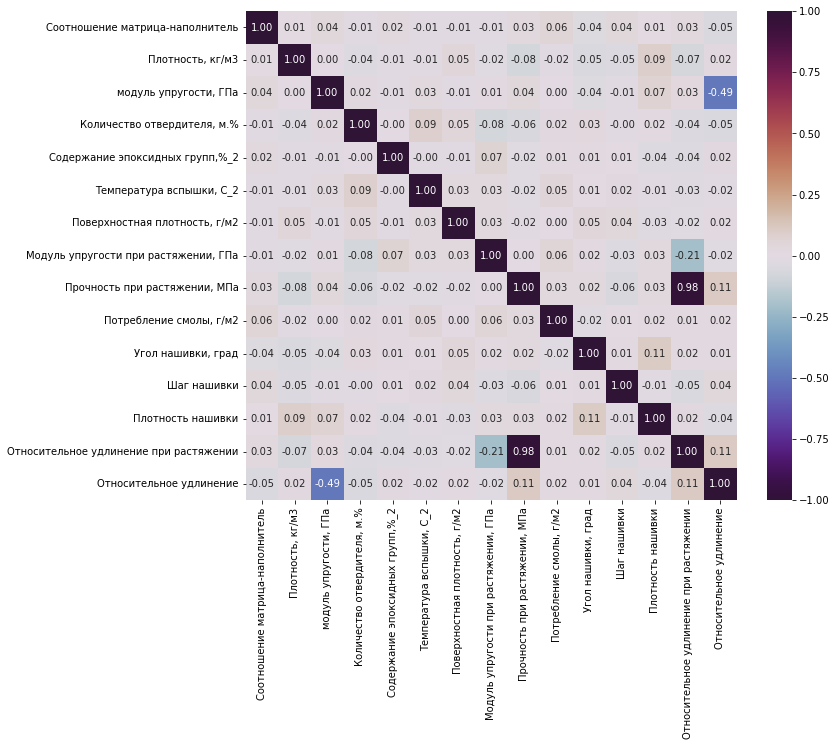

In [68]:
# Матрица корреляции по Пирсону после нормализации
corr = df.corr() # Пирсон по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

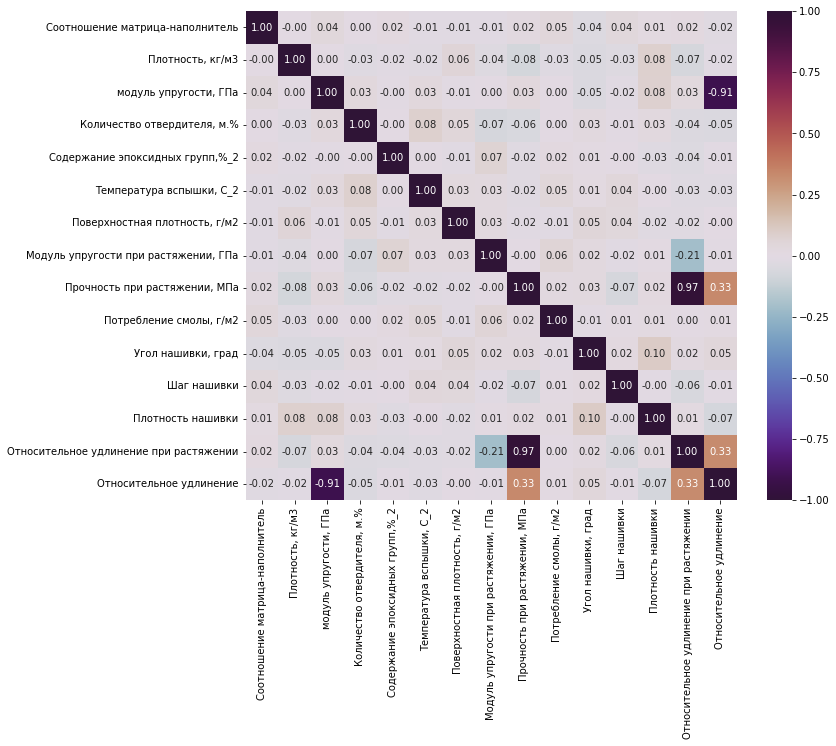

In [69]:
# Матрица корреляции по Спирмену после нормализации
corr = df.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

### 6. Нормализация значений параметров с помощью метода MinMaxScaler

In [66]:
# Загрузка MinMaxScaler из библиотеки sklearn.preprocessing
from sklearn.preprocessing import MinMaxScaler

In [67]:
# Применение MinMaxScaler для нормализации датасета df
min_max_scaler = MinMaxScaler()
df_norm = pd.DataFrame(min_max_scaler.fit_transform(df), columns = df.columns, index=df.index)

In [68]:
# Описательная статистика нормализованного датасета df
df_norm.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
count,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000
mean,0.489986,0.466802,0.442332,0.496999,0.493204,0.488829,0.371895,0.497674,0.501412,0.512704,0.498994,0.477812,0.506527,0.489059,0.035642
std,0.175098,0.178604,0.199597,0.171105,0.179639,0.174891,0.215049,0.166912,0.173223,0.170436,0.500251,0.177152,0.163548,0.175324,0.072906
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.370573,0.340568,0.297705,0.384682,0.369061,0.372209,0.206588,0.388086,0.382697,0.400953,0.000000,0.352496,0.404477,0.368663,0.013034
50%,0.485309,0.471977,0.442287,0.495765,0.491612,0.488501,0.349186,0.493533,0.498630,0.513653,0.000000,0.478498,0.509730,0.485466,0.020568
75%,0.608883,0.579329,0.577646,0.614834,0.623741,0.606200,0.534926,0.605495,0.607888,0.625812,1.000000,0.594044,0.611523,0.601284,0.032537
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


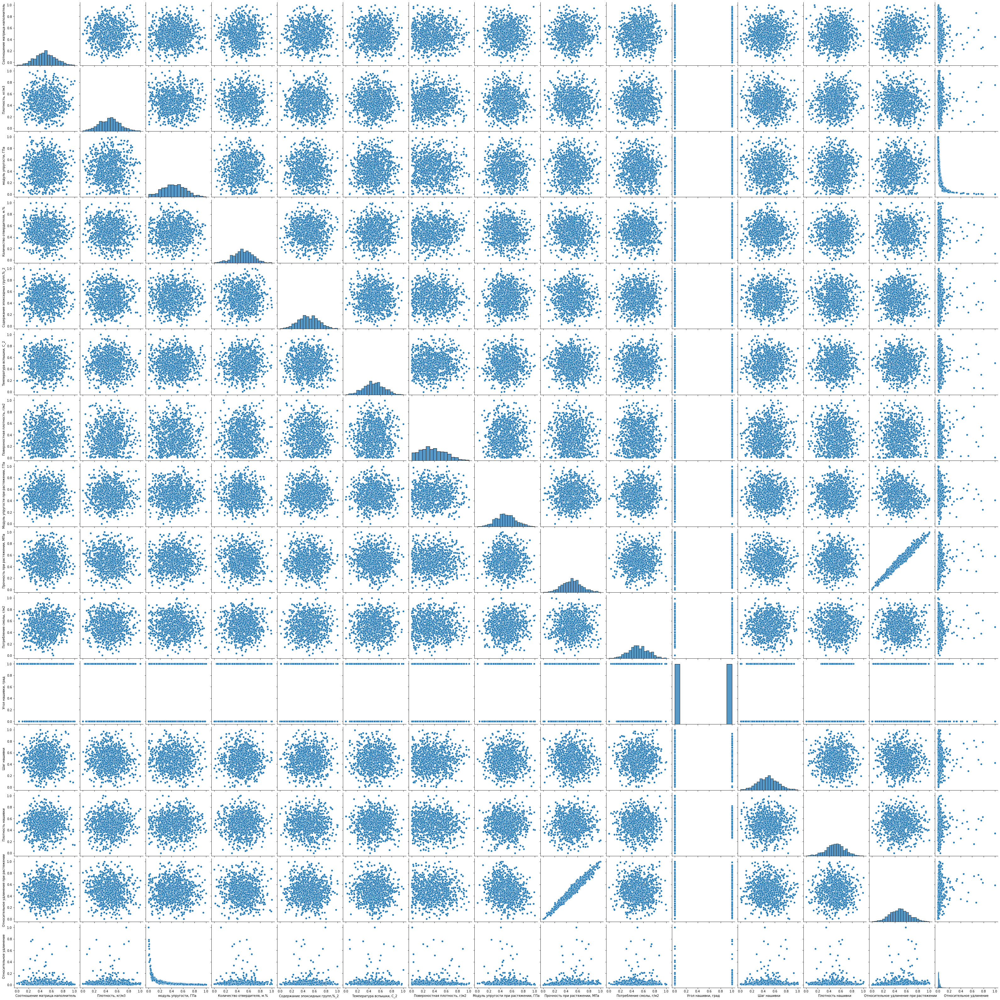

In [69]:
# Попарные графики рассеяния после нормализации
sns.pairplot(df_norm, height=3)

In [70]:
# Параметр 'Угол нашивки, град' - категориальный, поэтому его исключаем 
# при построении матрицы корреляции по критерию Пирсона
df_dnorm=df_norm[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки', 'Относительное удлинение при растяжении', 'Относительное удлинение']]
df_dnorm

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
1,0.282131,0.601381,0.440493,0.123047,0.607435,0.482823,0.162230,0.319194,0.694512,0.517418,0.275109,0.544652,0.729211,0.026010
3,0.282131,0.601381,0.440493,0.608021,0.418887,0.549664,0.162230,0.319194,0.694512,0.517418,0.344539,0.365074,0.729211,0.026010
4,0.457857,0.601381,0.449256,0.502800,0.495653,0.482823,0.162230,0.319194,0.694512,0.517418,0.344539,0.503211,0.729211,0.025381
5,0.457201,0.527898,0.446184,0.502800,0.495653,0.482823,0.162230,0.319194,0.694512,0.517418,0.344539,0.544652,0.729211,0.025599
6,0.419084,0.307448,0.482432,0.502800,0.495653,0.482823,0.162230,0.319194,0.694512,0.517418,0.344539,0.682789,0.729211,0.023200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,0.361750,0.410540,0.547468,0.350139,0.333908,0.657301,0.161609,0.485125,0.473900,0.242759,0.627565,0.365347,0.463038,0.014181
1019,0.587163,0.650588,0.259861,0.712271,0.294428,0.350746,0.271207,0.475992,0.464215,0.221717,0.730963,0.458327,0.455397,0.036209
1020,0.555750,0.460227,0.242722,0.494656,0.623085,0.325580,0.572959,0.573346,0.573138,0.565435,0.286298,0.650046,0.540570,0.045053
1021,0.637396,0.691520,0.442175,0.684130,0.267818,0.444436,0.496511,0.536217,0.360273,0.451281,0.435716,0.520631,0.340804,0.015644


###### Оценка корреляции параметров датасета после очистки и нормализации

Оценка нормальности распределения параметров по статистическому критерию Шапиро-Уилка:

In [71]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.998, p-value=0.220
Плотность, кг/м3 : 	 	 	Statistics=0.997, p-value=0.092
модуль упругости, ГПа : 	 	 	Statistics=0.995, p-value=0.003
Количество отвердителя, м.% : 	 	 	Statistics=0.998, p-value=0.185
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.998, p-value=0.214
Температура вспышки, С_2 : 	 	 	Statistics=0.998, p-value=0.467
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.978, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.998, p-value=0.165
Прочность при растяжении, МПа : 	 	 	Statistics=0.998, p-value=0.267
Потребление смолы, г/м2 : 	 	 	Statistics=0.998, p-value=0.242
Шаг нашивки : 	 	 	Statistics=0.998, p-value=0.194
Плотность нашивки : 	 	 	Statistics=0.998, p-value=0.141
Относительное удлинение при растяжении : 	 	 	Statistics=0.998, p-value=0.260
Относительное удлинение : 	 	 	Statistics=0.310, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

Вывод: после очистки и нормализации по тесту Шапиро-Уилка параметры 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2', 'Относительное удлинение' имеют вид распределения статистически отличный от нормального, распределения всех остальных параметров статистически не отличаются от нормального (уровень значимости 0,05)

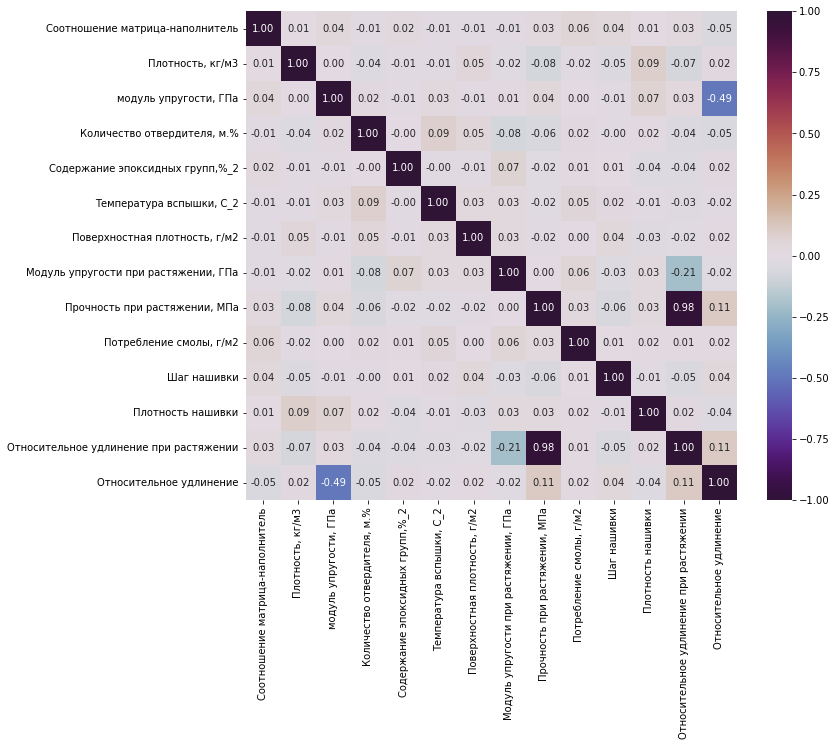

In [72]:
# Матрица корреляции по Пирсону после нормализации
corr = df_dnorm.corr() # Пирсон по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

Проверка корреляции по критерию Пирсона:

формулировка гипотезы:

H0: R = 0,

H1: R не равен 0 с заданным уровнем значимости равным 0,05/

In [73]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm.columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col], df_dnorm[col1]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель














2
Плотность, кг/м3







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.076, p-value=0.016



Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.092, p-value=0.004

Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 
Statistics=-0.068, p-value=0.031


3
модуль упругости, ГПа









Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.073, p-value=0.022


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.492, p-value=0.000

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.087, p-value=0.006


Наименование колонок и строк С корреляцией: 
Ко

Статистически значимыми по критерию Пирсона являются следующие попарные корреляции между количественными параметрами:
    
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.076, p-value=0.016
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.092, p-value=0.004
    Плотность, кг/м3  &  Относительное удлинение при растяжении : Statistics=-0.068, p-value=0.031
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.073, p-value=0.022
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.492, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.087, p-value=0.006
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.077, p-value=0.015
    Содержание эпоксидных групп,%_2  &  Модуль упругости при растяжении, ГПа : Statistics=0.069, p-value=0.030
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.206, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : 	Statistics=0.977, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.110, p-value=0.000
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.112, p-value=0.000

Вывод: статистически значимыми по критерию Пирсона до нормализации были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 Statistics=-0.062, p-value=0.046
    модуль упругости, ГПа  &  Относительное удлинение : 		 Statistics=-0.223, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении :  Statistics=-0.216, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении :  Statistics=0.977, p-value=0.000             

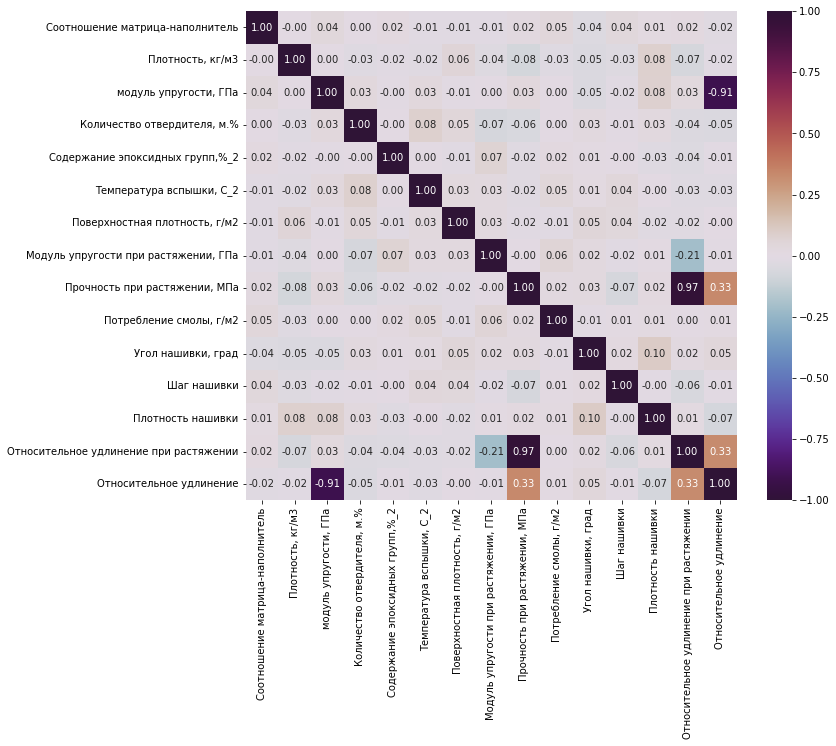

In [74]:
# Матрица корреляции по Спирмену после нормализации
corr = df_norm.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

Проверка корреляции по критерию Спирмена:

формулировка гипотезы: 

H0: R = 0, 

H1: R не равен 0 с заданным уровнем значимости равным 0,05

In [75]:
# Проверка по критерию Спирмена
accepted_list = []
rejected_list = []

for col in df_norm.columns:
    alpha = 0.05
    stat, p = stats.spearmanr(df_norm['Угол нашивки, град'] , df_norm[col]) # ранговая корреляция Спирмена
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=-0.037, p-value=0.241
Плотность, кг/м3 : 	 	 	Statistics=-0.050, p-value=0.116
модуль упругости, ГПа : 	 	 	Statistics=-0.049, p-value=0.120
Количество отвердителя, м.% : 	 	 	Statistics=0.026, p-value=0.414
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.009, p-value=0.775
Температура вспышки, С_2 : 	 	 	Statistics=0.014, p-value=0.657
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.053, p-value=0.094
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.024, p-value=0.453
Прочность при растяжении, МПа : 	 	 	Statistics=0.027, p-value=0.388
Потребление смолы, г/м2 : 	 	 	Statistics=-0.009, p-value=0.785
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.018, p-value=0.569
Плотность нашивки : 	 	 	Statistics=0.103, p-value=0.001
Относительное удлинение при растяжении : 	 	 	Statistics=0.021, p-value=0.503
Относительное удлинение : 	 	 	Statistics=0.047, p-value=0.141

Наименование колонок,

Вывод: согласно критерию Спирмена корреляция тех же самых параметров до нормализации 'Угол нашивки, град' и 'Плотность, кг/м3', а также 'Угол нашивки, град' и 'Плотность нашивки'

Ранее было показано, что по тесту Шапиро-Уилка параметры 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2', 'Относительное удлинение' имеют вид распределения статистически отличный от нормального, поэтому корреляцию этих парметров между собой и с остальными параметрами следует проверять по критерию Спирмена:

In [76]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm.columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[col], df_norm[col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))


1
Соотношение матрица-наполнитель















2
Плотность, кг/м3







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.077, p-value=0.015




Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.084, p-value=0.008

Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 
Statistics=-0.068, p-value=0.033


3
модуль упругости, ГПа










Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.080, p-value=0.012


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.912, p-value=0.000

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.085, p-value=0.007


Наименование колонок и строк С корреляцией: 

Вывод: кроме того для параметров 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2', 'Относительное удлинение' проверка по критерию Спирмена показала, что значимы следующие корреляции:

    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.080, p-value=0.012
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.912, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.334, p-value=0.000
    Плотность нашивки  &  Относительное удлинение : Statistics=-0.071, p-value=0.024
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.328, p-value=0.000

###### Разбиение датасета на части и проверка значимости корреляций в каждой части датасета

In [77]:
# Вывод информации о датасете df_dnorm
df_dnorm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 994 entries, 1 to 1022
Data columns (total 14 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         994 non-null    float64
 1   Плотность, кг/м3                        994 non-null    float64
 2   модуль упругости, ГПа                   994 non-null    float64
 3   Количество отвердителя, м.%             994 non-null    float64
 4   Содержание эпоксидных групп,%_2         994 non-null    float64
 5   Температура вспышки, С_2                994 non-null    float64
 6   Поверхностная плотность, г/м2           994 non-null    float64
 7   Модуль упругости при растяжении, ГПа    994 non-null    float64
 8   Прочность при растяжении, МПа           994 non-null    float64
 9   Потребление смолы, г/м2                 994 non-null    float64
 10  Шаг нашивки                             994 non-null    float

In [78]:
# 1-ая часть датасета
df_dnorm[0:247].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
1,0.282131,0.601381,0.440493,0.123047,0.607435,0.482823,0.16223,0.319194,0.694512,0.517418,0.275109,0.544652,0.729211,0.026010
3,0.282131,0.601381,0.440493,0.608021,0.418887,0.549664,0.16223,0.319194,0.694512,0.517418,0.344539,0.365074,0.729211,0.026010
4,0.457857,0.601381,0.449256,0.502800,0.495653,0.482823,0.16223,0.319194,0.694512,0.517418,0.344539,0.503211,0.729211,0.025381
5,0.457201,0.527898,0.446184,0.502800,0.495653,0.482823,0.16223,0.319194,0.694512,0.517418,0.344539,0.544652,0.729211,0.025599
6,0.419084,0.307448,0.482432,0.502800,0.495653,0.482823,0.16223,0.319194,0.694512,0.517418,0.344539,0.682789,0.729211,0.023200


In [79]:
# 2-ая часть датасета
df_dnorm[248:495].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
258,0.483817,0.559944,0.594277,0.479185,0.503406,0.371498,0.024993,0.380721,0.930147,0.743215,0.495989,0.411328,0.951337,0.023015
259,0.316556,0.828056,0.613076,0.593061,0.282287,0.466401,0.402438,0.641672,0.114400,0.298480,0.207111,0.502833,0.087366,0.003928
260,0.817485,0.273632,0.343639,0.769562,0.673720,0.592135,0.402799,0.333474,0.932314,0.411230,0.204192,0.542916,0.970369,0.044323
261,0.674772,0.249429,0.263534,0.321325,0.657323,0.392108,0.255501,0.678375,0.645667,0.431463,0.435277,0.105897,0.585412,0.044781
263,0.527732,0.483835,0.487116,0.377774,0.544269,0.412824,0.623313,0.485475,0.401704,0.457601,0.705523,0.553378,0.391347,0.014747


In [80]:
# 3-ья часть датасета
df_dnorm[496:743].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
516,0.773831,0.052060,0.691378,0.838907,0.211386,0.606981,0.578222,0.346499,0.810367,0.423803,0.605151,0.407883,0.840282,0.016477
517,0.406480,0.579207,0.560043,0.471721,0.564871,0.402338,0.155887,0.770105,0.622382,0.895241,0.501455,0.504518,0.542624,0.017327
518,0.422397,0.193299,0.411640,0.465072,0.624927,0.604185,0.289070,0.798344,0.597123,0.669449,0.369870,0.715954,0.513205,0.025067
519,0.421354,0.474495,0.590150,0.826371,0.545757,0.264993,0.611964,0.644976,0.735340,0.639547,0.241473,0.107897,0.678864,0.018715
521,0.571837,0.524013,0.529517,0.719271,0.156785,0.431924,0.333301,0.780731,0.216928,0.448567,0.403666,0.885424,0.166229,0.008280


In [81]:
# 4-ая часть датасета
df_dnorm[744:994].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
769,0.790930,0.276567,0.416781,0.918931,0.306313,0.588882,0.260537,0.210970,0.372474,0.720723,0.545162,0.511544,0.418918,0.017390
771,0.551449,0.324271,0.775244,0.124325,0.289405,0.508675,0.180605,0.442089,0.642723,0.653836,0.574784,0.602599,0.641831,0.010989
772,0.646002,0.658134,0.411856,0.657361,0.490000,0.644078,0.395352,0.477588,0.469778,0.651488,0.573166,0.575477,0.460582,0.020869
773,0.125321,0.689021,0.152717,0.623499,0.702619,0.716149,0.702671,0.381876,0.229746,0.730671,0.299989,0.681231,0.237327,0.044513
774,0.570006,0.551694,0.551896,0.811889,0.257636,0.736782,0.155626,0.767485,0.374276,0.686830,0.258209,0.559854,0.313596,0.011553


Оценка нормальности распределения параметров по статистическому критерию Шапиро-Уилка:

In [82]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[0:247].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[0:247][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.991, p-value=0.143
Плотность, кг/м3 : 	 	 	Statistics=0.995, p-value=0.616
модуль упругости, ГПа : 	 	 	Statistics=0.988, p-value=0.044
Количество отвердителя, м.% : 	 	 	Statistics=0.988, p-value=0.035
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.997, p-value=0.861
Температура вспышки, С_2 : 	 	 	Statistics=0.996, p-value=0.726
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.973, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.993, p-value=0.295
Прочность при растяжении, МПа : 	 	 	Statistics=0.994, p-value=0.370
Потребление смолы, г/м2 : 	 	 	Statistics=0.992, p-value=0.172
Шаг нашивки : 	 	 	Statistics=0.994, p-value=0.392
Плотность нашивки : 	 	 	Statistics=0.988, p-value=0.039
Относительное удлинение при растяжении : 	 	 	Statistics=0.994, p-value=0.453
Относительное удлинение : 	 	 	Statistics=0.363, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

In [83]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[248:495].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[248:495][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.994, p-value=0.508
Плотность, кг/м3 : 	 	 	Statistics=0.995, p-value=0.685
модуль упругости, ГПа : 	 	 	Statistics=0.995, p-value=0.524
Количество отвердителя, м.% : 	 	 	Statistics=0.996, p-value=0.823
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.995, p-value=0.619
Температура вспышки, С_2 : 	 	 	Statistics=0.991, p-value=0.154
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.972, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.994, p-value=0.383
Прочность при растяжении, МПа : 	 	 	Statistics=0.993, p-value=0.320
Потребление смолы, г/м2 : 	 	 	Statistics=0.994, p-value=0.396
Шаг нашивки : 	 	 	Statistics=0.992, p-value=0.232
Плотность нашивки : 	 	 	Statistics=0.992, p-value=0.208
Относительное удлинение при растяжении : 	 	 	Statistics=0.995, p-value=0.674
Относительное удлинение : 	 	 	Statistics=0.253, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

In [84]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[496:743].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[496:743][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.995, p-value=0.514
Плотность, кг/м3 : 	 	 	Statistics=0.993, p-value=0.259
модуль упругости, ГПа : 	 	 	Statistics=0.989, p-value=0.047
Количество отвердителя, м.% : 	 	 	Statistics=0.996, p-value=0.768
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.991, p-value=0.135
Температура вспышки, С_2 : 	 	 	Statistics=0.997, p-value=0.891
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.974, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.994, p-value=0.367
Прочность при растяжении, МПа : 	 	 	Statistics=0.996, p-value=0.806
Потребление смолы, г/м2 : 	 	 	Statistics=0.994, p-value=0.427
Шаг нашивки : 	 	 	Statistics=0.990, p-value=0.072
Плотность нашивки : 	 	 	Statistics=0.994, p-value=0.424
Относительное удлинение при растяжении : 	 	 	Statistics=0.997, p-value=0.946
Относительное удлинение : 	 	 	Statistics=0.283, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

In [85]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[744:994].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[744:994][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.994, p-value=0.378
Плотность, кг/м3 : 	 	 	Statistics=0.997, p-value=0.898
модуль упругости, ГПа : 	 	 	Statistics=0.989, p-value=0.065
Количество отвердителя, м.% : 	 	 	Statistics=0.997, p-value=0.906
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.992, p-value=0.179
Температура вспышки, С_2 : 	 	 	Statistics=0.996, p-value=0.834
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.976, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.994, p-value=0.409
Прочность при растяжении, МПа : 	 	 	Statistics=0.994, p-value=0.436
Потребление смолы, г/м2 : 	 	 	Statistics=0.996, p-value=0.757
Шаг нашивки : 	 	 	Statistics=0.999, p-value=0.999
Плотность нашивки : 	 	 	Statistics=0.994, p-value=0.356
Относительное удлинение при растяжении : 	 	 	Statistics=0.991, p-value=0.152
Относительное удлинение : 	 	 	Statistics=0.378, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

Вывод: при рассмотрении отдельных частей датасета установлено, что:

параметры 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Поверхностная плотность, г/м2', 'Плотность нашивки', 'Относительное удлинение' в 1-ой части датасета, 

параметры 'Поверхностная плотность, г/м2', 'Относительное удлинение' во 2-ой части датасета,

параметры 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2', 'Относительное удлинение' в 3-ьей части датасета,

параметры 'Поверхностная плотность, г/м2', 'Относительное удлинение' в 4-ой части датасета

Проверка различия групп по непараметрическому критерию Краскала-Уоллиса для групп больше двух:

Формулируем статистическую гипотезу для выявления различия групп по критерию Краскала-Уоллиса

H0: Статистически значимые отличия в группах отсутствуют с уровнем значимости равным 0,05.

H1: Присутствуют статистически значимые отличия в группах с тем же уровнем значимости

In [86]:
# проверка по критерию Краскала-Уоллиса
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:247][col])
    df2=np.array(df_dnorm[248:495][col])
    df3=np.array(df_dnorm[496:743][col])
    df4=np.array(df_dnorm[744:994][col])
    
    stat, p = stats.mstats.kruskalwallis(df1, df2, df3, df4) # критерий Краскала-Уоллиса 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=1.408, p-value=0.704
Плотность, кг/м3 : 	 	 	Statistics=2.225, p-value=0.527
модуль упругости, ГПа : 	 	 	Statistics=3.033, p-value=0.387
Количество отвердителя, м.% : 	 	 	Statistics=6.781, p-value=0.079
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=3.856, p-value=0.277
Температура вспышки, С_2 : 	 	 	Statistics=5.273, p-value=0.153
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.640, p-value=0.887
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=1.687, p-value=0.640
Прочность при растяжении, МПа : 	 	 	Statistics=1.420, p-value=0.701
Потребление смолы, г/м2 : 	 	 	Statistics=1.859, p-value=0.602
Шаг нашивки : 	 	 	Statistics=0.403, p-value=0.940
Плотность нашивки : 	 	 	Statistics=8.703, p-value=0.034
Относительное удлинение при растяжении : 	 	 	Statistics=1.393, p-value=0.707
Относительное удлинение : 	 	 	Statistics=3.284, p-value=0.350

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

Непараметрический критерий Фридмана для дисперсионного анализа групп:


Нулевая гипотеза (H 0 ): Среднее значение для каждой совокупности равно.

Альтернативная гипотеза: (H 1): по крайней мере одно среднее значение генеральной совокупности отличается от остальных

In [87]:
# проверка по критерию Фридмана
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:248].reset_index(drop=True)[col])
    df2=np.array(df_dnorm[249:497].reset_index(drop=True)[col])
    df3=np.array(df_dnorm[498:746].reset_index(drop=True)[col])
    df4=np.array(df_dnorm[746:994].reset_index(drop=True)[col])
    
    stat, p = stats.friedmanchisquare(df1, df2, df3, df4) # критерий Фридмана 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.295, p-value=0.961
Плотность, кг/м3 : 	 	 	Statistics=2.458, p-value=0.483
модуль упругости, ГПа : 	 	 	Statistics=1.534, p-value=0.674
Количество отвердителя, м.% : 	 	 	Statistics=2.318, p-value=0.509
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=2.792, p-value=0.425
Температура вспышки, С_2 : 	 	 	Statistics=5.115, p-value=0.164
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.334, p-value=0.954
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=1.355, p-value=0.716
Прочность при растяжении, МПа : 	 	 	Statistics=1.534, p-value=0.674
Потребление смолы, г/м2 : 	 	 	Statistics=0.498, p-value=0.919
Шаг нашивки : 	 	 	Statistics=0.305, p-value=0.959
Плотность нашивки : 	 	 	Statistics=7.060, p-value=0.070
Относительное удлинение при растяжении : 	 	 	Statistics=3.295, p-value=0.348
Относительное удлинение : 	 	 	Statistics=1.902, p-value=0.593

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

Вывод: сравнение датасетов по столбцам показывает, что отличие групп статистически незначимо, расчет по критерию Фридмана для всего датасета показывает, что различие по дисперсиям все-таки возможно значимо:

In [88]:
stats.friedmanchisquare(df_dnorm[0:248],df_dnorm[249:497],df_dnorm[498:746],df_dnorm[746:994])

FriedmanchisquareResult(statistic=-1766025044.9101787, pvalue=1.0)

In [89]:
stats.friedmanchisquare(df_dnorm[0:248],df_dnorm[249:497],df_dnorm[498:746])

FriedmanchisquareResult(statistic=-50097222.94864048, pvalue=1.0)

In [90]:
stats.friedmanchisquare(df_dnorm[0:248],df_dnorm[498:746],df_dnorm[746:994])

FriedmanchisquareResult(statistic=-50132648.73957703, pvalue=1.0)

In [91]:
stats.friedmanchisquare(df_dnorm[0:248],df_dnorm[249:497],df_dnorm[746:994])

FriedmanchisquareResult(statistic=-50175836.848338366, pvalue=1.0)

In [92]:
stats.friedmanchisquare(df_dnorm[249:497],df_dnorm[498:746],df_dnorm[746:994])

FriedmanchisquareResult(statistic=83751066.2016129, pvalue=0.0)

Статистическое сравнение 2х групп следует осуществить по критерию Колмогорова-Смирнова.

Формулировка гипотезы по критерию Колмогорова-Смирнова:

H0: Статистически значимые отличия в группах отсутствуют (уровень значимости равен 0,05).

H1: Присутствуют статистически значимые отличия в группах с тем же уровнем значимости.

In [93]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:247][col])
    df2=np.array(df_dnorm[248:][col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.054, p-value=0.626
Плотность, кг/м3 : 	 	 	Statistics=0.043, p-value=0.870
модуль упругости, ГПа : 	 	 	Statistics=0.091, p-value=0.087
Количество отвердителя, м.% : 	 	 	Statistics=0.095, p-value=0.064
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.078, p-value=0.200
Температура вспышки, С_2 : 	 	 	Statistics=0.094, p-value=0.069
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.052, p-value=0.683
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.071, p-value=0.289
Прочность при растяжении, МПа : 	 	 	Statistics=0.066, p-value=0.377
Потребление смолы, г/м2 : 	 	 	Statistics=0.074, p-value=0.246
Шаг нашивки : 	 	 	Statistics=0.067, p-value=0.355
Плотность нашивки : 	 	 	Statistics=0.160, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=0.064, p-value=0.406
Относительное удлинение : 	 	 	Statistics=0.062, p-value=0.452

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

In [94]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[248:495][col])
    df2=np.array(df_dnorm[0:247].append(df_dnorm[496:],sort=False)[col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.049, p-value=0.741


C:\Users\Admin\AppData\Local\Temp\ipykernel_5464\4258519098.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:247].append(df_dnorm[496:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_5464\4258519098.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:247].append(df_dnorm[496:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_5464\4258519098.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:247].append(df_dnorm[496:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_5464\4258519098.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

Плотность, кг/м3 : 	 	 	Statistics=0.077, p-value=0.211
модуль упругости, ГПа : 	 	 	Statistics=0.064, p-value=0.418
Количество отвердителя, м.% : 	 	 	Statistics=0.091, p-value=0.086
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.076, p-value=0.225
Температура вспышки, С_2 : 	 	 	Statistics=0.099, p-value=0.048
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.054, p-value=0.619
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.043, p-value=0.865
Прочность при растяжении, МПа : 	 	 	Statistics=0.047, p-value=0.777
Потребление смолы, г/м2 : 	 	 	Statistics=0.044, p-value=0.841
Шаг нашивки : 	 	 	Statistics=0.080, p-value=0.173
Плотность нашивки : 	 	 	Statistics=0.137, p-value=0.002
Относительное удлинение при растяжении : 	 	 	Statistics=0.041, p-value=0.902
Относительное удлинение : 	 	 	Statistics=0.067, p-value=0.349

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругос

C:\Users\Admin\AppData\Local\Temp\ipykernel_5464\4258519098.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:247].append(df_dnorm[496:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_5464\4258519098.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:247].append(df_dnorm[496:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_5464\4258519098.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:247].append(df_dnorm[496:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_5464\4258519098.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

In [95]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[496:743][col])
    df2=np.array(df_dnorm[0:497].append(df_dnorm[744:],sort=False)[col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

C:\Users\Admin\AppData\Local\Temp\ipykernel_5464\2028555836.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:497].append(df_dnorm[744:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_5464\2028555836.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:497].append(df_dnorm[744:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_5464\2028555836.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:497].append(df_dnorm[744:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_5464\2028555836.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

Соотношение матрица-наполнитель : 	 	 	Statistics=0.057, p-value=0.561
Плотность, кг/м3 : 	 	 	Statistics=0.068, p-value=0.337
модуль упругости, ГПа : 	 	 	Statistics=0.061, p-value=0.472
Количество отвердителя, м.% : 	 	 	Statistics=0.052, p-value=0.669
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.047, p-value=0.779
Температура вспышки, С_2 : 	 	 	Statistics=0.079, p-value=0.180
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.050, p-value=0.728
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.073, p-value=0.255
Прочность при растяжении, МПа : 	 	 	Statistics=0.046, p-value=0.799
Потребление смолы, г/м2 : 	 	 	Statistics=0.045, p-value=0.817
Шаг нашивки : 	 	 	Statistics=0.052, p-value=0.671
Плотность нашивки : 	 	 	Statistics=0.139, p-value=0.001
Относительное удлинение при растяжении : 	 	 	Statistics=0.033, p-value=0.980
Относительное удлинение : 	 	 	Statistics=0.040, p-value=0.910

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

C:\Users\Admin\AppData\Local\Temp\ipykernel_5464\2028555836.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:497].append(df_dnorm[744:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_5464\2028555836.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:497].append(df_dnorm[744:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_5464\2028555836.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:497].append(df_dnorm[744:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_5464\2028555836.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

In [96]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:743][col])
    df2=np.array(df_dnorm[744:][col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.048, p-value=0.750
Плотность, кг/м3 : 	 	 	Statistics=0.075, p-value=0.234
модуль упругости, ГПа : 	 	 	Statistics=0.082, p-value=0.150
Количество отвердителя, м.% : 	 	 	Statistics=0.067, p-value=0.354
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.062, p-value=0.441
Температура вспышки, С_2 : 	 	 	Statistics=0.074, p-value=0.243
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.058, p-value=0.521
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.036, p-value=0.964
Прочность при растяжении, МПа : 	 	 	Statistics=0.064, p-value=0.400
Потребление смолы, г/м2 : 	 	 	Statistics=0.066, p-value=0.378
Шаг нашивки : 	 	 	Statistics=0.053, p-value=0.639
Плотность нашивки : 	 	 	Statistics=0.153, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=0.075, p-value=0.228
Относительное удлинение : 	 	 	Statistics=0.071, p-value=0.291

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

Вывод: попарное различие групп по непараметрическому критерию Колмогорова-Смирнова наблюдается по параметру 'Плотность нашивки'

Однофакторный дисперсионный анализ использует следующие нулевую и альтернативную гипотезы :

    H 0 (нулевая гипотеза): µ 1 = µ 2 = µ 3 = … = µ k (все средние значения совокупности равны)
    H 1 (нулевая гипотеза): по крайней мере одно среднее значение популяции отличаетсяот остальных


Чтобы результаты однофакторного дисперсионного анализа были достоверными, должны выполняться следующие допущения:
1. Нормальность. Каждая выборка была взята из нормально распределенной популяции.
2. Равные дисперсии — дисперсии совокупностей, из которых взяты выборки, равны. Вы можете использовать тест Бартлетта, чтобы проверить это предположение.
3. Независимость.Наблюдения в каждой группе независимы друг от друга, а наблюдения внутри групп были получены путем случайной выборки.    


Тест Бартлетта использует следующие нулевые и альтернативные гипотезы :

H 0 : Дисперсия среди каждой группы равна.

H 1 : По крайней мере, одна группа имеет дисперсию, не равную остальным.

In [97]:
# Проверка по критериям ANOVA & Baltlet-test
for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:247][col])
    df2=np.array(df_dnorm[248:495][col])
    df3=np.array(df_dnorm[496:743][col])
    df4=np.array(df_dnorm[744:994][col])
    stat1, bart_test = stats.bartlett(df1, df2, df3, df4)
    stat2, fish_test = f_oneway(df1, df2, df3, df4)
    print(col, ': \t \t \t'  'Statistics Bartlet=%.3f, p-value=%.3f' % (stat1, bart_test))
    print(col, ': \t \t \t'  'Statistics F-test=%.3f, p-value=%.3f' % (stat2, fish_test))

Соотношение матрица-наполнитель : 	 	 	Statistics Bartlet=3.225, p-value=0.358
Соотношение матрица-наполнитель : 	 	 	Statistics F-test=0.668, p-value=0.572
Плотность, кг/м3 : 	 	 	Statistics Bartlet=10.511, p-value=0.015
Плотность, кг/м3 : 	 	 	Statistics F-test=0.822, p-value=0.482
модуль упругости, ГПа : 	 	 	Statistics Bartlet=6.577, p-value=0.087
модуль упругости, ГПа : 	 	 	Statistics F-test=1.333, p-value=0.262
Количество отвердителя, м.% : 	 	 	Statistics Bartlet=4.711, p-value=0.194
Количество отвердителя, м.% : 	 	 	Statistics F-test=2.280, p-value=0.078
Содержание эпоксидных групп,%_2 : 	 	 	Statistics Bartlet=1.717, p-value=0.633
Содержание эпоксидных групп,%_2 : 	 	 	Statistics F-test=1.257, p-value=0.288
Температура вспышки, С_2 : 	 	 	Statistics Bartlet=2.151, p-value=0.542
Температура вспышки, С_2 : 	 	 	Statistics F-test=1.913, p-value=0.126
Поверхностная плотность, г/м2 : 	 	 	Statistics Bartlet=1.262, p-value=0.738
Поверхностная плотность, г/м2 : 	 	 	Statistics F-te

Вывод: дисперсии статистически различаются для 'Плотность нашивки'

Корреляционные матрицы для частей датасета:

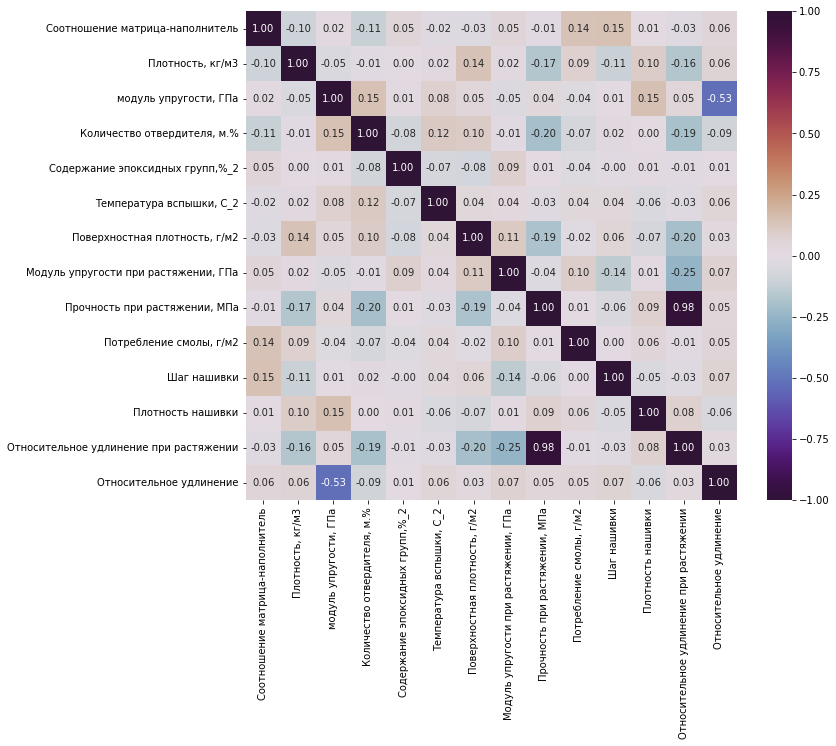

In [98]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[0:247].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [99]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[0:247].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[0:247].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][0:247], df_dnorm[col1][0:247]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель









Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 		 
Statistics=0.142, p-value=0.026

Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Шаг нашивки : 		 
Statistics=0.146, p-value=0.021




2
Плотность, кг/м3





Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.145, p-value=0.023


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.167, p-value=0.009




Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 
Statistics=-0.165, p-value=0.010


3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=0.147, p-value=0.021








Наименование колонок и строк С корреляцией: 
модуль упругости,

Выводы: статистически значимыми по критерию Пирсона после очистки для 1-ой четверти датасета стали следующие попарные корреляции между количественными параметрами:
    
    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.142, p-value=0.026
    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=0.146, p-value=0.021
    Плотность, кг/м3  &  Поверхностная плотность, г/м2 : Statistics=0.145, p-value=0.023
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.167, p-value=0.009
    Плотность, кг/м3  &  Относительное удлинение при растяжении : Statistics=-0.165, p-value=0.010
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.147, p-value=0.021
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.152, p-value=0.017
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.525, p-value=0.000
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.203, p-value=0.001
    Количество отвердителя, м.%  &  Относительное удлинение при растяжении : Statistics=-0.195, p-value=0.002
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.186, p-value=0.003
    Поверхностная плотность, г/м2  &  Относительное удлинение при растяжении : Statistics=-0.204, p-value=0.001
    Модуль упругости при растяжении, ГПа  &  Шаг нашивки : Statistics=-0.139, p-value=0.029
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.250, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.976, p-value=0.000

Статистически значимыми по критерию Пирсона до разбивки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 Statistics=-0.062, p-value=0.046
    модуль упругости, ГПа  &  Относительное удлинение : 		 Statistics=-0.223, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении :  Statistics=-0.216, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении :  Statistics=0.977, p-value=0.000 

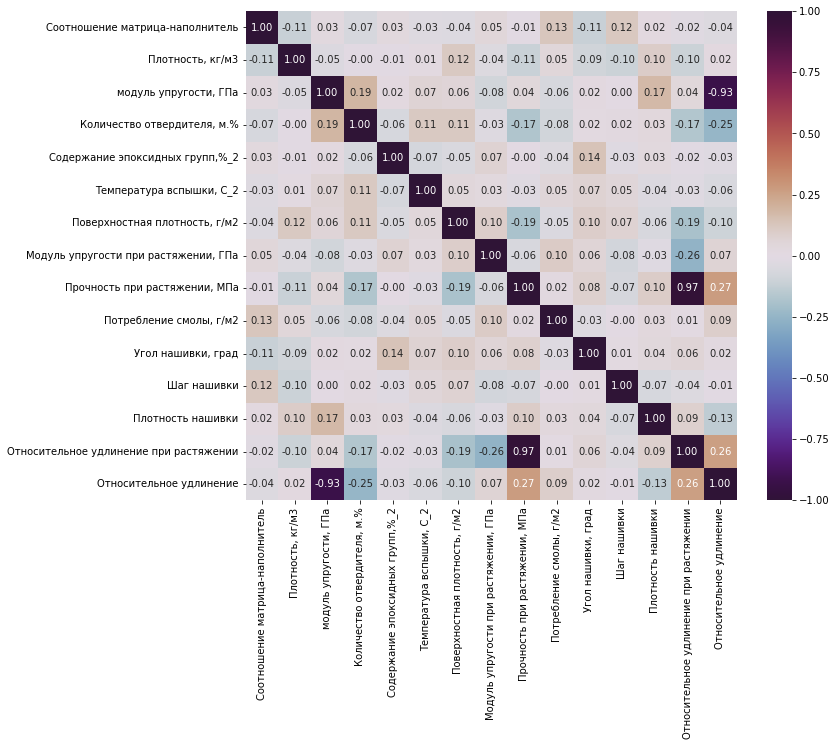

In [100]:
# Матрица корреляции по Спирмену
df1 = df_norm[0:247]
corr = df1.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [101]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[0:247].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[0:247].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[0:247][col], df_norm[0:247][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель









Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 		 
Statistics=0.127, p-value=0.046






2
Плотность, кг/м3














3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=0.187, p-value=0.003









Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.173, p-value=0.007


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.928, p-value=0.000

4
Количество отвердителя, м.%





Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 		 
Statistics=-0.174, p-value=0.006





Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Относительное удлинение при растяжении : 		 
Statistics=-0.170, p-value=0.00

Вывод: в 1-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.127, p-value=0.046
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.187, p-value=0.003
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.173, p-value=0.007
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.928, p-value=0.000
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.174, p-value=0.006
    Количество отвердителя, м.%  &  Относительное удлинение при растяжении : Statistics=-0.170, p-value=0.008
    Количество отвердителя, м.%  &  Относительное удлинение : Statistics=-0.246, p-value=0.000
    Содержание эпоксидных групп,%_2  &  Угол нашивки, град : Statistics=0.137, p-value=0.031
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.190, p-value=0.003
    Поверхностная плотность, г/м2  &  Относительное удлинение при растяжении : Statistics=-0.194, p-value=0.002
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.257, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.974, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.273, p-value=0.000
    Плотность нашивки  &  Относительное удлинение : Statistics=-0.134, p-value=0.036
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.263, p-value=0.000

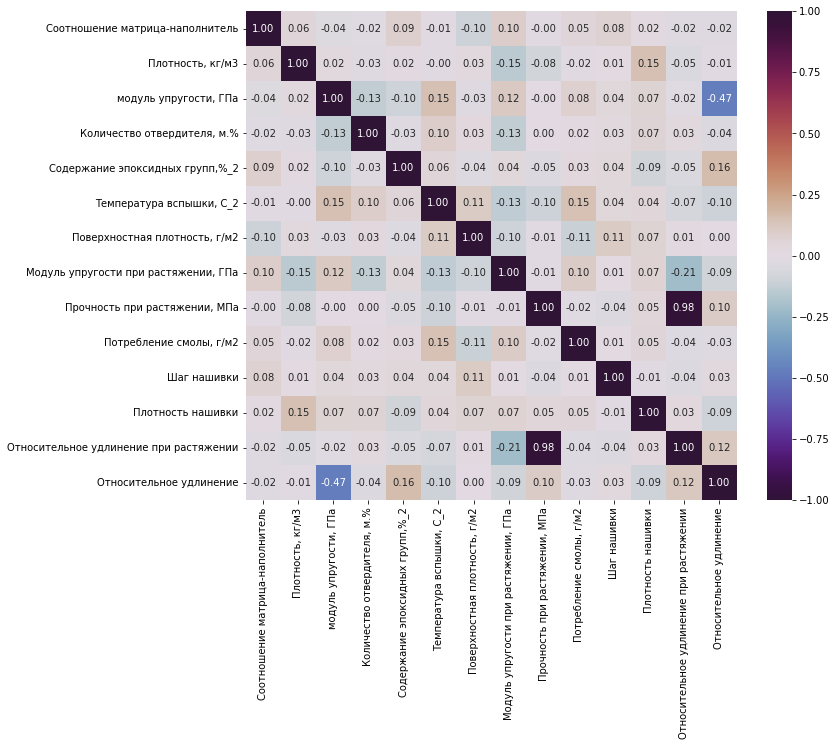

In [102]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[248:495].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [103]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[248:495].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[248:495].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][248:495], df_dnorm[col1][248:495]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель














2
Плотность, кг/м3






Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.146, p-value=0.022




Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.152, p-value=0.017



3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=-0.130, p-value=0.041


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Температура вспышки, С_2 : 		 
Statistics=0.152, p-value=0.017








Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.473, p-value=0.000

4
Количество отвердителя, м.%




Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.130, p-value=0.041







5
Содержание эпокси

Выводы: статистически значимыми по критерию Пирсона после очистки для 2-ой четверти датасета стали следующие попарные корреляции между количественными параметрами:

    Плотность, кг/м3  &  Модуль упругости при растяжении, ГПа : Statistics=-0.146, p-value=0.022
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.152, p-value=0.017
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=-0.130, p-value=0.041
    модуль упругости, ГПа  &  Температура вспышки, С_2 : Statistics=0.152, p-value=0.017
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.473, p-value=0.000
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.130, p-value=0.041
    Содержание эпоксидных групп,%_2  &  Относительное удлинение : Statistics=0.162, p-value=0.011
    Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : Statistics=-0.135, p-value=0.034
    Температура вспышки, С_2  &  Потребление смолы, г/м2 : Statistics=0.147, p-value=0.021
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.215, p-value=0.001
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.977, p-value=0.000

Статистически значимыми по критерию Пирсона до очистки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 Statistics=-0.062, p-value=0.046
    модуль упругости, ГПа  &  Относительное удлинение : 		 Statistics=-0.223, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении :  Statistics=-0.216, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении :  Statistics=0.977, p-value=0.000             

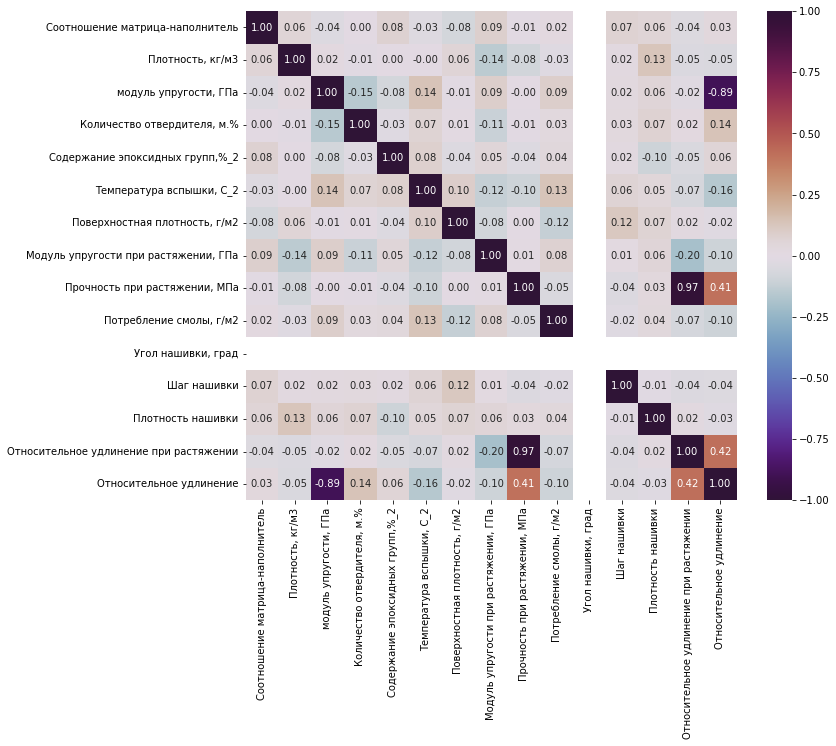

In [104]:
# Матрица корреляции по Спирмену
df2 = df_norm[248:495]
corr = df2.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [105]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[248:495].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[248:495].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[248:495][col], df_norm[248:495][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель










Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





2
Плотность, кг/м3






Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.143, p-value=0.025



Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.130, p-value=0.042



3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=-0.154, p-value=0.015


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Температура вспышки, С_2 : 		 
Statistics=0.140, p-value=0.028





Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Угол нашивки, град : 		 


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:4484: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


Вывод: в 2-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Плотность, кг/м3  &  Модуль упругости при растяжении, ГПа : Statistics=-0.143, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.130, p-value=0.042
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=-0.154, p-value=0.015
    модуль упругости, ГПа  &  Температура вспышки, С_2 : Statistics=0.140, p-value=0.028
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.893, p-value=0.000
    Количество отвердителя, м.%  &  Относительное удлинение : Statistics=0.140, p-value=0.028
    Температура вспышки, С_2  &  Потребление смолы, г/м2 : Statistics=0.134, p-value=0.036
    Температура вспышки, С_2  &  Относительное удлинение : Statistics=-0.157, p-value=0.013
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.196, p-value=0.002
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.974, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.408, p-value=0.000
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.416, p-value=0.000

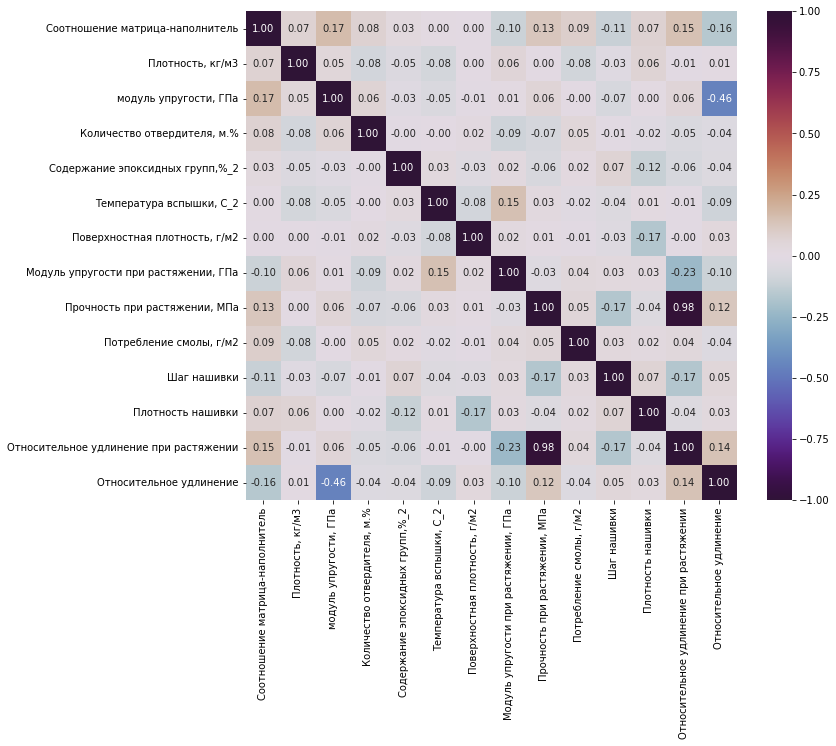

In [106]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[496:743].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [107]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[496:743].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[496:743].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][496:743], df_dnorm[col1][496:743]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель


Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  модуль упругости, ГПа : 		 
Statistics=0.168, p-value=0.008






Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : 		 
Statistics=0.129, p-value=0.042




Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Относительное удлинение при растяжении : 		 
Statistics=0.149, p-value=0.019

Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Относительное удлинение : 		 
Statistics=-0.159, p-value=0.012

2
Плотность, кг/м3













3
модуль упругости, ГПа











Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.455, p-value=0.000

4
Количество отвердителя, м.%











5
Содержание эпоксидных групп,%_2










6
Температура вспышки, С_2


Наименование колонок и строк С корреляцией:

Выводы: статистически значимыми по критерию Пирсона после очистки для 3-ьей четверти датасета стали следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  модуль упругости, ГПа : Statistics=0.168, p-value=0.008
    Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : Statistics=0.129, p-value=0.042
    Соотношение матрица-наполнитель  &  Относительное удлинение при растяжении : Statistics=0.149, p-value=0.019
    Соотношение матрица-наполнитель  &  Относительное удлинение : Statistics=-0.159, p-value=0.012
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.455, p-value=0.000
    Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : Statistics=0.151, p-value=0.018
    Поверхностная плотность, г/м2  &  Плотность нашивки : Statistics=-0.168, p-value=0.008
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.231, p-value=0.000
    Прочность при растяжении, МПа  &  Шаг нашивки : Statistics=-0.165, p-value=0.009
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.979, p-value=0.000
    Шаг нашивки  &  Относительное удлинение при растяжении : Statistics=-0.168, p-value=0.008
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.142, p-value=0.026

Статистически значимыми по критерию Пирсона до очистки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 Statistics=-0.062, p-value=0.046
    модуль упругости, ГПа  &  Относительное удлинение : 		 Statistics=-0.223, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении :  Statistics=-0.216, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении :  Statistics=0.977, p-value=0.000             

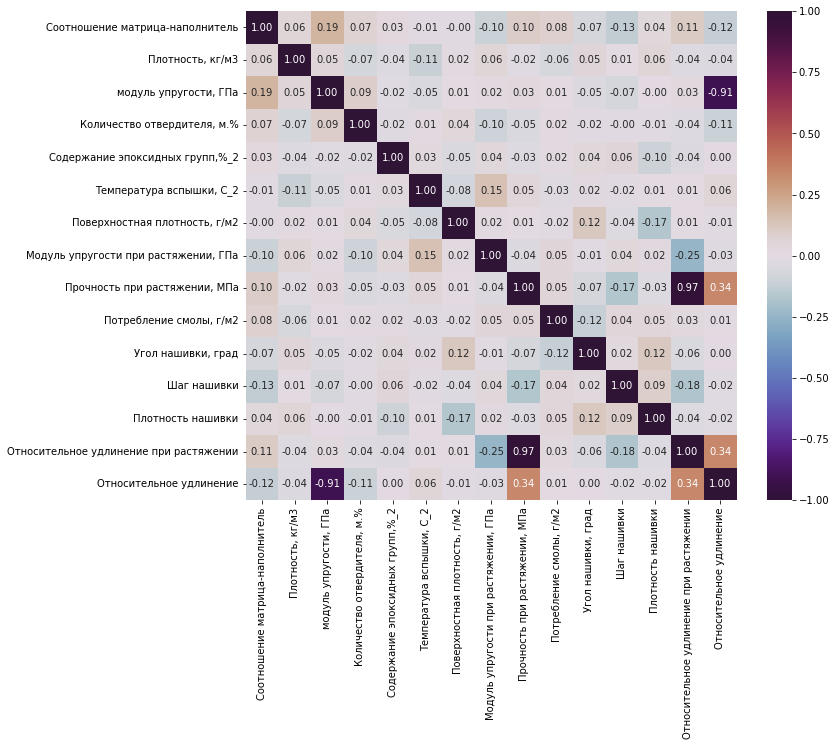

In [108]:
# Матрица корреляции по Спирмену
df3 = df_norm[496:743]
corr = df3.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [109]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[496:743].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[496:743].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[496:743][col], df_norm[496:743][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель


Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  модуль упругости, ГПа : 		 
Statistics=0.189, p-value=0.003









Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Шаг нашивки : 		 
Statistics=-0.133, p-value=0.036




2
Плотность, кг/м3














3
модуль упругости, ГПа












Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.910, p-value=0.000

4
Количество отвердителя, м.%












5
Содержание эпоксидных групп,%_2











6
Температура вспышки, С_2


Наименование колонок и строк С корреляцией: 
Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=0.147, p-value=0.021








7
Поверхностная плотность, г/м2






Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Плотность нашивки : 		 
Statistics=-0.168, p-value=0.008



8
Модуль упругости при 

Вывод: в 3-ьей части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Соотношение матрица-наполнитель  &  модуль упругости, ГПа : Statistics=0.189, p-value=0.003
    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=-0.133, p-value=0.036
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.910, p-value=0.000
    Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : Statistics=0.147, p-value=0.021
    Поверхностная плотность, г/м2  &  Плотность нашивки : Statistics=-0.168, p-value=0.008
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.245, p-value=0.000
    Прочность при растяжении, МПа  &  Шаг нашивки : Statistics=-0.169, p-value=0.008
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.974, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.340, p-value=0.000
    Шаг нашивки  &  Относительное удлинение при растяжении : Statistics=-0.178, p-value=0.005
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.339, p-value=0.000

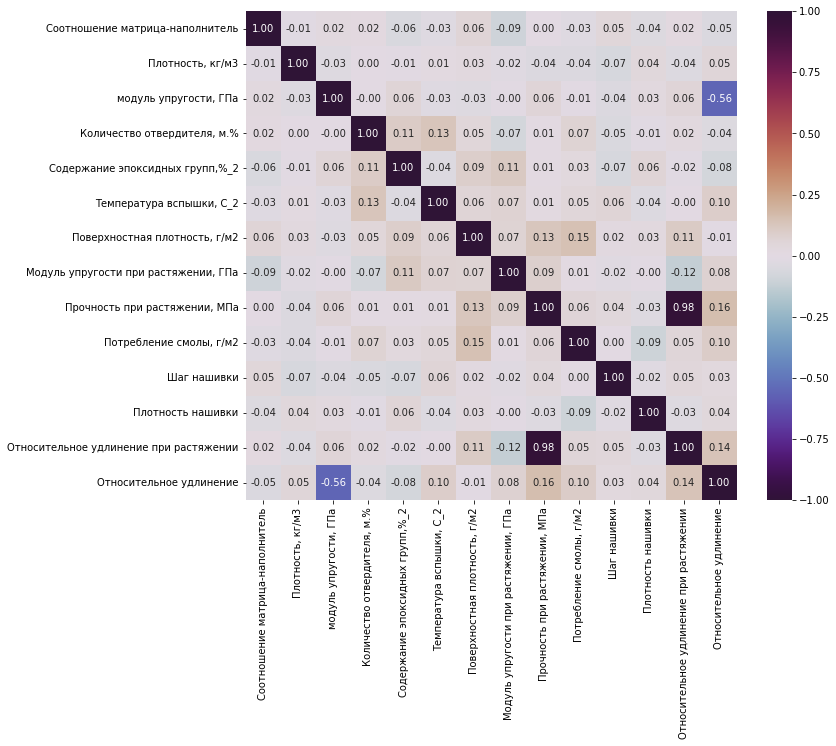

In [110]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[744:994].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [111]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[744:994].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[744:994].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][744:994], df_dnorm[col1][744:994]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель














2
Плотность, кг/м3













3
модуль упругости, ГПа











Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.558, p-value=0.000

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.132, p-value=0.038









5
Содержание эпоксидных групп,%_2










6
Температура вспышки, С_2









7
Поверхностная плотность, г/м2


Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : 		 
Statistics=0.127, p-value=0.045

Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Потребление смолы, г/м2 : 		 
Statistics=0.147, p-value=0.020





8
Модуль упругости при растяжении, ГПа





Наименование колонок и строк С корреляцией: 
Модуль упругости при растяжении, ГПа  &  Относительное удлинение при ра

Выводы: статистически значимыми по критерию Пирсона после очистки для 4-ой четверти датасета стали следующие попарные корреляции между количественными параметрами:

    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.558, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.132, p-value=0.038
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=0.127, p-value=0.045
    Поверхностная плотность, г/м2  &  Потребление смолы, г/м2 : Statistics=0.147, p-value=0.020
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.124, p-value=0.049
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.977, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.161, p-value=0.011
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.140, p-value=0.027

Статистически значимыми по критерию Пирсона до очистки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 Statistics=-0.062, p-value=0.046
    модуль упругости, ГПа  &  Относительное удлинение : 		 Statistics=-0.223, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении :  Statistics=-0.216, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении :  Statistics=0.977, p-value=0.000             

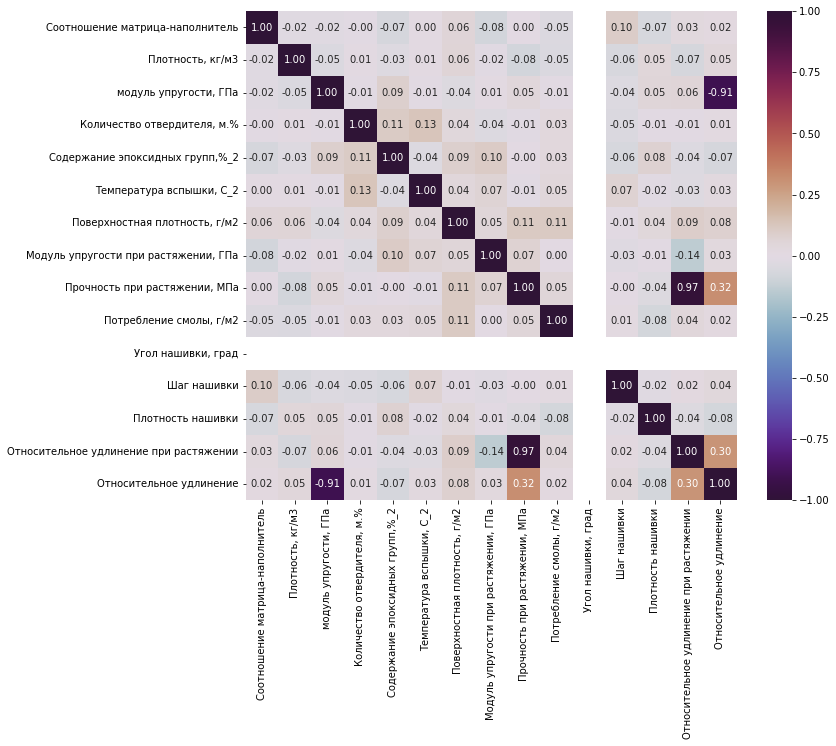

In [112]:
# Матрица корреляции по Спирмену
df4 = df_norm[744:994]
corr = df4.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [113]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[744:994].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[744:994].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[744:994][col], df_norm[744:994][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель










Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





2
Плотность, кг/м3









Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





3
модуль упругости, ГПа








Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan




Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.909, p-value=0.000

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.131, p-value=0.038





Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





5
Содержание эпоксидных групп,%_2






Наименование коло

Вывод: в 4-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.909, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.131, p-value=0.038
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.139, p-value=0.028
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.970, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.320, p-value=0.000
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.300, p-value=0.000

ОБЩИЙ ВЫВОД ПО КОРРЕЛЯЦИИ ДАТАСЕТА, РАЗБИТОГО НА 4 РАВНЫЕ ЧАСТИ: для 1-ой части датасета произошло заметное изменение значимости параметров, а также увеличение некоторых коэффициентов корреляции в корреляционной матрице, отсюда можно сделать вывод, что, вероятно, в 1-ой четверти датасета находится статистически значимая часть датасета

ОБЩИЙ ВЫВОД ПО ПРЕДВАРИТЕЛЬНОЙ ОБРАБОТКЕ ДАТАСЕТА: Методами статистического анализа в общем целом датасете не удалось выяснить связей между исходными параметрами датасета. Данные датасета представляют собой в значительной мере случайные числа с нормальным распределением, кроме значений углов нашивки в 'Угол нашивки, град'. Статистически отличаются от нормального распределения параметры 'модуль упругости, ГПа', 'Поверхностная плотность' и 'Плотность нашивки'.

Не удалось выяснить в общем датасете также заметные связи между данными из двух разных файлов 'X_bp.xlsx' и 'X_nup.xlsx'. Соответствие между данными из этих двух файлов вероятно является произвольным.

Показатель R-квадрат рассмотренных линейных моделей регрессии без учета расчетных параметров 'Относительное удлинение при растяжении' и 'Относительное удлинение' максимально имеет величину не более 0,03, что указывает на низкое качество моделей, которые выдают результат близкий к средним значениям.

Был сделан ОБЩИЙ ВЫВОД, что данные включают в себя значительное количество сгенерированных чисел с нормальным распределением